In [1]:
# XLD_LSTM_XGBoosst_SHAP

In [24]:
# LSTMSingle+XGBoost
# 使用前732步长的数据，预测后续9个步长的数据。
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error, root_mean_squared_log_error, r2_score, explained_variance_score
from xgboost import XGBRegressor
import datetime

import os
import random
from sklearn.utils import shuffle

# 检查是否有可用的GPU
if tf.config.list_physical_devices('GPU'):
    print("GPU is available.")
else:
    print("GPU is not available, using CPU.")

# 随机生成种子并打印
# # SEED = random.randint(0, 2**32 - 1)
# SEED = random.randint(0, 3408)
# print(f"Random Seed: {SEED}")

# # 设置所有库的随机种子
# random.seed(SEED) #为Python的随机数生成器设置种子
# np.random.seed(SEED) # 设置 numpy 的随机种子
# tf.random.set_seed(SEED) # 设置 TensorFlow 的随机种子
# # os.environ['TF_DETERMINISTIC_OPS'] = '1' #如果你在使用GPU，还需要设置一个环境变量来确保数值运算的可重复性
# random_state = SEED # 设置 sklearn 的随机种子。

# 数据预处理
scaler = MinMaxScaler()
dataXLDX = df.iloc[:, 0:8]
dataXLDXmm = scaler.fit_transform(dataXLDX)
dataXLDXmm = pd.DataFrame(dataXLDXmm)
dataXLDX.iloc[:, :] = dataXLDXmm.values
dataXLDy = df.iloc[:, 8]
dataXLD = pd.concat([dataXLDX, dataXLDy], axis=1)
print("dataXLD: ", dataXLD.head())

features, target = dataXLDX.values.astype(np.float32), dataXLDy.values.astype(np.float32)

# 将数据转换为适合LSTM输入的格式
def create_dataset(features, target, window_size, predict_steps):
    X, y = [], []
    for i in range(0, len(features) - window_size - predict_steps + 1, predict_steps):  # 滚动步长为3
        X.append(features[i:(i + window_size)])
        y.append(target[(i + window_size):(i + window_size + predict_steps)])
    return np.array(X), np.array(y)

# window_size = 1463  # 使用前面1463步长的数据
# window_size = 1098  # 使用前面1098步长的数据
window_size = 732  # 使用前面732步长的数据
predict_steps = 9  # 预测后续1个步长

# 构建LSTM模型
def build_model(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)
    x, state_h, state_c = LSTM(64, return_sequences=True, return_state=True)(x)
    
    final_state = x[:, -1, :]  # 最后一个时间步的隐状态
    x = Dense(64, activation='relu')(final_state)
    x = Dropout(0.2)(x)
    outputs = Dense(predict_steps)(x)  # 输出长度为predict_steps
    
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model, final_state

model, final_state = build_model((window_size, features.shape[1]))
model.summary()

# 设置早停机制
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

# 训练模型
X_train, y_train = create_dataset(features, target, window_size=window_size, predict_steps=predict_steps)
print(X_train.shape, y_train.shape)  # 输出形状

history = model.fit(X_train, y_train, validation_split=0.2, epochs=1, batch_size=32, callbacks=[early_stopping])

# 提取LSTM模型的最后一步隐状态
lstm_final_states = []
true_values = []

# Rolling window training and prediction
for i in range(0, len(features) - window_size - predict_steps + 1, predict_steps):
    X_predict = features[i:(i + window_size)].reshape(1, window_size, features.shape[1])
    lstm_final_state = model.predict(X_predict)
    lstm_final_states.append(lstm_final_state[0])
    true_values.extend(target[(i + window_size):(i + window_size + predict_steps)])

lstm_final_states = np.array(lstm_final_states)

# 使用XGBoost进行预测
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, use_label_encoder=False, random_state=3407, tree_method="hist", device="cuda")
xgb_model.fit(lstm_final_states, np.array(true_values).reshape(-1, predict_steps))

xgb_predictions = xgb_model.predict(lstm_final_states)

# 确保所有列都是一维的
true_values = np.array(true_values).flatten()
xgb_predictions = np.array(xgb_predictions).flatten()

# 输出预测结果和真实值
results_df = pd.DataFrame({
    'True Values': true_values,
    'XGBoost Predictions': xgb_predictions
})
print(results_df.head())
print(results_df.shape)

# 计算误差指标
r2 = r2_score(true_values, xgb_predictions)
mse = mean_squared_error(true_values, xgb_predictions)
rmse = root_mean_squared_error(true_values, xgb_predictions)
mae = mean_absolute_error(true_values, xgb_predictions)
mape = mean_absolute_percentage_error(true_values, xgb_predictions)
msle = mean_squared_log_error(true_values, xgb_predictions)
rmsle = root_mean_squared_log_error(true_values, xgb_predictions)
evs = explained_variance_score(true_values, xgb_predictions)

# 保存到Excel文件
# current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
current_time = datetime.datetime.now().strftime("%m%d_%H%M%S")
print(current_time)
with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
    results_df.to_excel(writer, sheet_name=f'{r2:.4f}XldLSTMXGBp9_{current_time}', index=False)

# 打印误差指标
print(f'R2: {r2}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'MAPE: {mape}')
print(f'MSLE: {msle}')
print(f'RMSLE: {rmsle}')
print(f'EVS: {evs}')
print(f'Bias={bias(true_values, xgb_predictions)} \nAbias={abias(true_values, xgb_predictions)} \nPbias={pbias(true_values, xgb_predictions)} \nKGE={kge(true_values, xgb_predictions)} \nNRMSE={nrmse(true_values, xgb_predictions)} \nAdjusted_r2={adjusted_r2(true_values, xgb_predictions, 8)} \nNSE={NSE(true_values, xgb_predictions)}')
print(results_df.shape)

GPU is available.
dataXLD:              Month       Day  Temperature  DewPoint  Pressure  WindDirection  \
date                                                                          
2007-01-01    0.0  0.000000     0.154237  0.493587  0.690649       0.254237   
2007-01-02    0.0  0.033333     0.135254  0.483720  0.725644       0.245763   
2007-01-03    0.0  0.066667     0.180678  0.408979  0.742161       0.360169   
2007-01-04    0.0  0.100000     0.221017  0.437593  0.709127       0.872881   
2007-01-05    0.0  0.133333     0.243729  0.288111  0.745801       0.872881   

            WindSpeed  XldWaterLevel  XiaoLangDi  
date                                              
2007-01-01   0.131332       0.142857       175.0  
2007-01-02   0.131332       0.164557       217.0  
2007-01-03   0.168856       0.162749       214.0  
2007-01-04   0.318949       0.168174       225.0  
2007-01-05   0.787992       0.159132       207.0  


C:\Users\LiJintao\AppData\Local\Temp\ipykernel_13952\4294222056.py:41: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.         0.         0.         ... 0.18181818 0.18181818 0.18181818]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataXLDX.iloc[:, :] = dataXLDXmm.values
C:\Users\LiJintao\AppData\Local\Temp\ipykernel_13952\4294222056.py:41: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.         0.03333333 0.06666667 ... 0.26666667 0.3        0.33333333]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataXLDX.iloc[:, :] = dataXLDXmm.values


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 732, 8)]          0         
                                                                 
 lstm_8 (LSTM)               (None, 732, 64)           18688     
                                                                 
 lstm_9 (LSTM)               [(None, 732, 64),         33024     
                              (None, 64),                        
                              (None, 64)]                        
                                                                 
 tf.__operators__.getitem_4   (None, 64)               0         
 (SlicingOpLambda)                                               
                                                                 
 dense_8 (Dense)             (None, 64)                4160      
                                                           

C:\ProgramData\anaconda3\envs\tf210\lib\site-packages\openpyxl\workbook\child.py:99: UserWarning: Title is more than 31 characters. Some applications may not be able to read the file
  warnings.warn("Title is more than 31 characters. Some applications may not be able to read the file")


R2: 0.9997864365577698
MSE: 134.0177764892578
RMSE: 11.576604843139648
MAE: 8.044562339782715
MAPE: 29918815584256.0
MSLE: 0.002844901755452156
RMSLE: 0.053337618708610535
EVS: 0.9997864365577698
Bias=0.0025603058747947216 
Abias=8.044562339782715 
Pbias=-0.00026269622285491885 
KGE=0.9949874865246636 
NRMSE=0.002097211079671979 
Adjusted_r2=0.9997861278843212 
NSE=0.9998105950650473
(5544, 2)


In [25]:
# LSTMSingle+XGBoost
# 使用前732步长的数据，预测后续12个步长的数据。
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, MultiHeadAttention, LayerNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error, root_mean_squared_log_error, r2_score, explained_variance_score
from xgboost import XGBRegressor
import datetime

import os
import random
from sklearn.utils import shuffle

# 检查是否有可用的GPU
if tf.config.list_physical_devices('GPU'):
    print("GPU is available.")
else:
    print("GPU is not available, using CPU.")

# 随机生成种子并打印
# # SEED = random.randint(0, 2**32 - 1)
# SEED = random.randint(0, 3408)
# print(f"Random Seed: {SEED}")

# # 设置所有库的随机种子
# random.seed(SEED) #为Python的随机数生成器设置种子
# np.random.seed(SEED) # 设置 numpy 的随机种子
# tf.random.set_seed(SEED) # 设置 TensorFlow 的随机种子
# # os.environ['TF_DETERMINISTIC_OPS'] = '1' #如果你在使用GPU，还需要设置一个环境变量来确保数值运算的可重复性
# random_state = SEED # 设置 sklearn 的随机种子。

# 数据预处理
scaler = MinMaxScaler()
dataXLDX = df.iloc[:, 0:8]
dataXLDXmm = scaler.fit_transform(dataXLDX)
dataXLDXmm = pd.DataFrame(dataXLDXmm)
dataXLDX.iloc[:, :] = dataXLDXmm.values
dataXLDy = df.iloc[:, 8]
dataXLD = pd.concat([dataXLDX, dataXLDy], axis=1)
print("dataXLD: ", dataXLD.head())

features, target = dataXLDX.values.astype(np.float32), dataXLDy.values.astype(np.float32)

# 将数据转换为适合LSTM输入的格式
def create_dataset(features, target, window_size, predict_steps):
    X, y = [], []
    for i in range(0, len(features) - window_size - predict_steps + 1, predict_steps):  # 滚动步长为3
        X.append(features[i:(i + window_size)])
        y.append(target[(i + window_size):(i + window_size + predict_steps)])
    return np.array(X), np.array(y)

# window_size = 1463  # 使用前面1463步长的数据
# window_size = 1098  # 使用前面1098步长的数据
window_size = 732  # 使用前面732步长的数据
predict_steps = 12  # 预测后续1个步长

# 构建LSTM模型
def build_model(input_shape):
    inputs = Input(shape=input_shape)
    x = LSTM(64, return_sequences=True)(inputs)
    x, state_h, state_c = LSTM(64, return_sequences=True, return_state=True)(x)
    
    final_state = x[:, -1, :]  # 最后一个时间步的隐状态
    x = Dense(64, activation='relu')(final_state)
    x = Dropout(0.2)(x)
    outputs = Dense(predict_steps)(x)  # 输出长度为predict_steps
    
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='mse')
    return model, final_state

model, final_state = build_model((window_size, features.shape[1]))
model.summary()

# 设置早停机制
early_stopping = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True)

# 训练模型
X_train, y_train = create_dataset(features, target, window_size=window_size, predict_steps=predict_steps)
print(X_train.shape, y_train.shape)  # 输出形状

history = model.fit(X_train, y_train, validation_split=0.2, epochs=1, batch_size=32, callbacks=[early_stopping])

# 提取LSTM模型的最后一步隐状态
lstm_final_states = []
true_values = []

# Rolling window training and prediction
for i in range(0, len(features) - window_size - predict_steps + 1, predict_steps):
    X_predict = features[i:(i + window_size)].reshape(1, window_size, features.shape[1])
    lstm_final_state = model.predict(X_predict)
    lstm_final_states.append(lstm_final_state[0])
    true_values.extend(target[(i + window_size):(i + window_size + predict_steps)])

lstm_final_states = np.array(lstm_final_states)

# 使用XGBoost进行预测
xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=100, use_label_encoder=False, random_state=3407, tree_method="hist", device="cuda")
xgb_model.fit(lstm_final_states, np.array(true_values).reshape(-1, predict_steps))

xgb_predictions = xgb_model.predict(lstm_final_states)

# 确保所有列都是一维的
true_values = np.array(true_values).flatten()
xgb_predictions = np.array(xgb_predictions).flatten()

# 输出预测结果和真实值
results_df = pd.DataFrame({
    'True Values': true_values,
    'XGBoost Predictions': xgb_predictions
})
print(results_df.head())
print(results_df.shape)

# 计算误差指标
r2 = r2_score(true_values, xgb_predictions)
mse = mean_squared_error(true_values, xgb_predictions)
rmse = root_mean_squared_error(true_values, xgb_predictions)
mae = mean_absolute_error(true_values, xgb_predictions)
mape = mean_absolute_percentage_error(true_values, xgb_predictions)
msle = mean_squared_log_error(true_values, xgb_predictions)
rmsle = root_mean_squared_log_error(true_values, xgb_predictions)
evs = explained_variance_score(true_values, xgb_predictions)

# 保存到Excel文件
# current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
current_time = datetime.datetime.now().strftime("%m%d_%H%M%S")
print(current_time)
with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
    results_df.to_excel(writer, sheet_name=f'{r2:.4f}XldLSTMXGBp12_{current_time}', index=False)

# 打印误差指标
print(f'R2: {r2}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'MAPE: {mape}')
print(f'MSLE: {msle}')
print(f'RMSLE: {rmsle}')
print(f'EVS: {evs}')
print(f'Bias={bias(true_values, xgb_predictions)} \nAbias={abias(true_values, xgb_predictions)} \nPbias={pbias(true_values, xgb_predictions)} \nKGE={kge(true_values, xgb_predictions)} \nNRMSE={nrmse(true_values, xgb_predictions)} \nAdjusted_r2={adjusted_r2(true_values, xgb_predictions, 8)} \nNSE={NSE(true_values, xgb_predictions)}')
print(results_df.shape)

GPU is available.
dataXLD:              Month       Day  Temperature  DewPoint  Pressure  WindDirection  \
date                                                                          
2007-01-01    0.0  0.000000     0.154237  0.493587  0.690649       0.254237   
2007-01-02    0.0  0.033333     0.135254  0.483720  0.725644       0.245763   
2007-01-03    0.0  0.066667     0.180678  0.408979  0.742161       0.360169   
2007-01-04    0.0  0.100000     0.221017  0.437593  0.709127       0.872881   
2007-01-05    0.0  0.133333     0.243729  0.288111  0.745801       0.872881   

            WindSpeed  XldWaterLevel  XiaoLangDi  
date                                              
2007-01-01   0.131332       0.142857       175.0  
2007-01-02   0.131332       0.164557       217.0  
2007-01-03   0.168856       0.162749       214.0  
2007-01-04   0.318949       0.168174       225.0  
2007-01-05   0.787992       0.159132       207.0  


C:\Users\LiJintao\AppData\Local\Temp\ipykernel_13952\458268139.py:41: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.         0.         0.         ... 0.18181818 0.18181818 0.18181818]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataXLDX.iloc[:, :] = dataXLDXmm.values
C:\Users\LiJintao\AppData\Local\Temp\ipykernel_13952\458268139.py:41: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.         0.03333333 0.06666667 ... 0.26666667 0.3        0.33333333]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataXLDX.iloc[:, :] = dataXLDXmm.values


Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 732, 8)]          0         
                                                                 
 lstm_10 (LSTM)              (None, 732, 64)           18688     
                                                                 
 lstm_11 (LSTM)              [(None, 732, 64),         33024     
                              (None, 64),                        
                              (None, 64)]                        
                                                                 
 tf.__operators__.getitem_5   (None, 64)               0         
 (SlicingOpLambda)                                               
                                                                 
 dense_10 (Dense)            (None, 64)                4160      
                                                           

C:\ProgramData\anaconda3\envs\tf210\lib\site-packages\openpyxl\workbook\child.py:99: UserWarning: Title is more than 31 characters. Some applications may not be able to read the file
  warnings.warn("Title is more than 31 characters. Some applications may not be able to read the file")


R2: 0.999984860420227
MSE: 9.509551048278809
RMSE: 3.0837559700012207
MAE: 2.0636212825775146
MAPE: 13387942592512.0
MSLE: 0.0015178077155724168
RMSLE: 0.03895905241370201
EVS: 0.999984860420227
Bias=-0.0020271786488592625 
Abias=2.0636212825775146 
Pbias=0.00020799551791915658 
KGE=0.9987265270342015 
NRMSE=0.0005586514598689973 
Adjusted_r2=0.9999848385382689 
NSE=0.9999865711994933
(5544, 2)


In [ ]:
#测试集画图
import matplotlib.pyplot as plt
xx30=range(0,len(y3_test))
plt.figure(figsize=(8,6))
# plt.scatter(xx30,y3_test,color="red",label="Observed",linewidth=3) 
# plt.plot(xx30,svr_pred3_test,color="orange",label="RF-MLPR")
plt.plot(dfNew["Object"],dfNew[""],label="Observed") 
plt.plot(xx30,svr_pred3_test,label="RF-MLPR",linewidth=3)
plt.legend()
# plt.show()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\论文试验记录及用图\第一图\MLP_y32test.tif', dpi=300,transparent=True)#transparent=True来指定透明度。

In [ ]:
# 折线图
plt.figure(figsize=(20,8))
# dfNew['Object'].plot(label="Observed",linewidth=2)#默认是kind="line"
dfNew['Object'].plot(label="Observed")#默认是kind="line"
dfNew['LSTM'].plot(label="LSTM")#默认是kind="line"
dfNew['XGBoost'].plot(label="XGBoost")
dfNew['LSTM-XGBoost'].plot(label="LSTM-XGBoost")
# 添加标题
plt.title('XldDaily Runoff')
# 添加图例
plt.legend()

#测试集数据画回归图
a01=np.arange(8000)
a02=a01*0.9
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfNew['Object'],dfNew['LSTM'],linewidth=2) 
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('LSTM')
# plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
# plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\论文试验记录及用图\第一图\RF_MLP_y32_test_Regre.tif', dpi=300,transparent=True)#transparent=True来指定透明度。
# plt.show()

# #所有数据画回归图
# a32=np.arange(8000)
# a33=a32*0.9
# # plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
# plt.scatter(df_y3,svr_pred3,linewidth=2) 
# plt.plot(a32,a33,linewidth=2)
# plt.xlabel('Observed')
# plt.ylabel('RF-MLPR')
# plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
# plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\论文试验记录及用图\第一图\RF_MLP_y32_full_Regre.tif', dpi=300,transparent=True)#transparent=True来指定透明度。
# plt.show()

In [ ]:
# 预测1天 回归图
#测试集数据画回归图
a01=np.arange(6000)
a02=a01*0.96
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM'], label='LSTM') 
plt.scatter(dfXld1New['Observed'],dfXld1New['XGBoost'], label='XGBoost') 
plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM-XGBoost'], label='LSTM-XGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('One-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\OneDayPre_RegreXLD1465.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

#测试集数据画回归图
a01=np.arange(6000)
# a02=a01*0.9
a02=a01*0.985
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM'], label='LSTM') 
plt.scatter(dfXld1New['Observed'],dfXld1New['XGBoost'], label='XGBoost')
plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM-Attention'], label='LSTM-Attention') 
plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM-XGBoost'], label='LSTM-XGBoost')
plt.scatter(dfXld1New['Observed'],dfXld1New['LAXGBoost'], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('One-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\OneDayAllPre_RegreXLD1465.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()
# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

# 小浪底
## 预测期1天

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

dfXld1=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre1',index_col='Date')
# dfXld1New=dfXld1.iloc[1464:6275, :]
dfXld1New=dfXld1.iloc[1463:, :]
dfXld1New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,603.133179,858.091309,520.11731,492.138184,486.352356
2011-01-04,459,540.12616,988.200256,439.220581,543.530029,459.57428
2011-01-05,493,527.537964,595.175964,547.918884,489.863922,492.888611
2011-01-06,493,542.414917,548.526917,515.243713,543.530029,493.043335
...,...,...,...,...,...,...
2024-03-07,524,695.805054,483.677368,654.468994,740.366577,NaN
2024-03-08,826,672.899414,640.005188,808.497681,677.903259,NaN
2024-03-09,1230,789.085083,1144.110474,942.832336,774.483521,NaN


In [8]:
dfXld1New['Observed'][1:]

Date
2011-01-03     486
2011-01-04     459
2011-01-05     493
2011-01-06     493
2011-01-07     720
              ... 
2024-03-07     524
2024-03-08     826
2024-03-09    1230
2024-03-10    1370
2024-03-11    1120
Name: Observed, Length: 4817, dtype: object

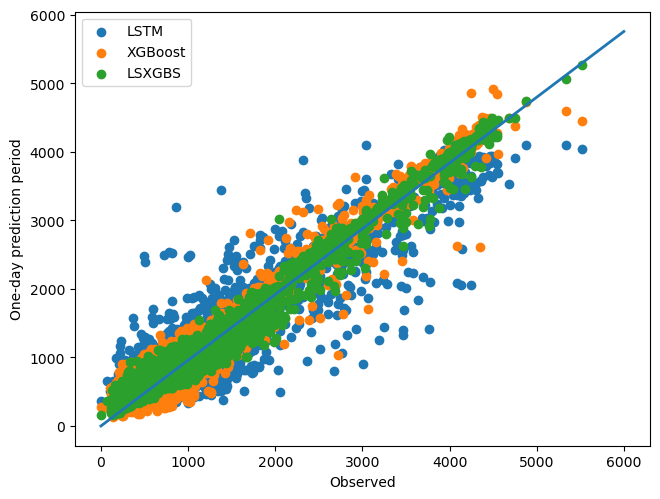

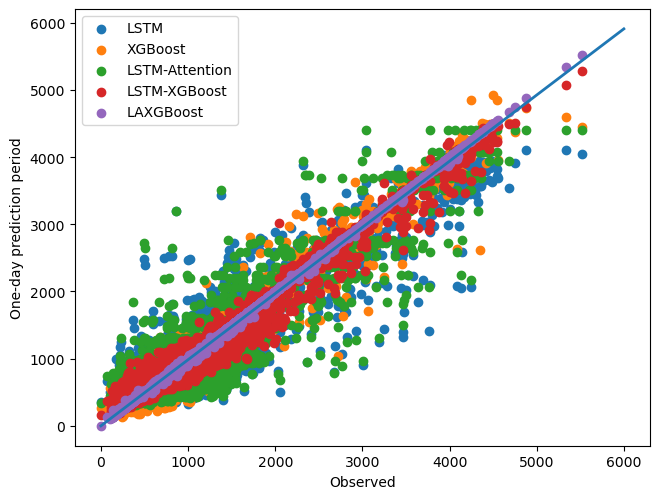

In [11]:
# 预测1天 回归图
#测试集数据画回归图
a01=np.arange(6000)
a02=a01*0.96
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['XGBoost'][1:], label='XGBoost') 
# plt.scatter(dfXld1New['Observed'],dfXld1New['LSTM-XGBoost'], label='LSTM-XGBoost')
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('One-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\OneDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

#测试集数据画回归图
a01=np.arange(6000)
# a02=a01*0.9
a02=a01*0.985
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['XGBoost'][1:], label='XGBoost')
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LSTM-Attention'][1:], label='LSTM-Attention') 
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld1New['Observed'][1:],dfXld1New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('One-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\OneDayAllPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()
# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## 预测期3天

In [13]:
dfXld3=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre3',index_col='Date')

dfXld3New=dfXld3.iloc[1463:, :]
dfXld3New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,597.074768,486.034851,523.834167,603.133179,571.611572
2011-01-04,459,493.22641,458.942841,470.836975,540.12616,520.798706
2011-01-05,493,500.512604,493.008728,540.178467,527.537964,607.696228
2011-01-06,493,506.580109,493.023407,539.606384,542.414917,521.814392
...,...,...,...,...,...,...
2024-03-07,524,772.877502,483.677368,484.407379,695.805054,596.715515
2024-03-08,826,690.875732,640.005188,711.486755,672.899414,683.769897
2024-03-09,1230,697.545227,1144.110474,967.331177,789.085083,1063.805054


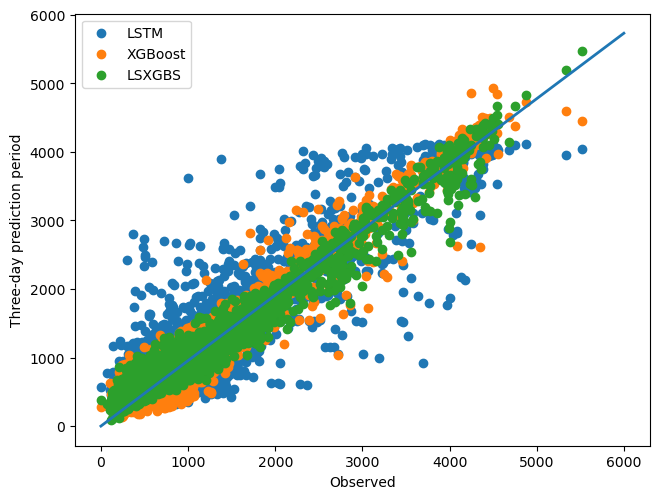

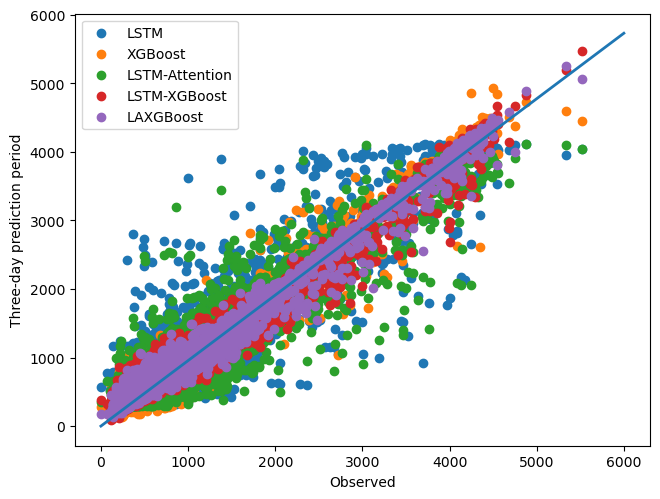

In [15]:
# 预测3天 回归图
# 预测值和观测值画回归图
a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Three-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\ThreeDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LSTM-Attention'][1:], label='LSTM-Attention')
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld3New['Observed'][1:],dfXld3New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Three-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\ThreeDayAllPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## 预测期6天

In [16]:
dfXld6=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre6',index_col='Date')

dfXld6New=dfXld6.iloc[1463:, :]
# dfXld6New.head()
dfXld6New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,689.79657,486.034851,523.834167,514.566284,571.611572
2011-01-04,459,548.682068,458.942841,470.836975,514.566284,520.798706
2011-01-05,493,555.906006,493.008728,540.178467,514.566284,607.696228
2011-01-06,493,561.957947,493.023407,539.606384,527.802124,521.814392
...,...,...,...,...,...,...
2024-03-07,524,932.232727,483.187531,484.407379,683.765259,596.715515
2024-03-08,826,NaN,640.099976,711.486755,670.091797,683.769897
2024-03-09,1230,NaN,1020.69104,967.331177,713.874023,1063.805054


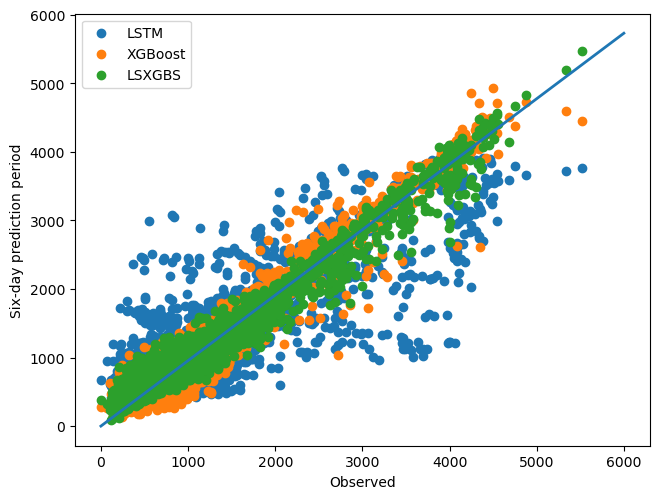

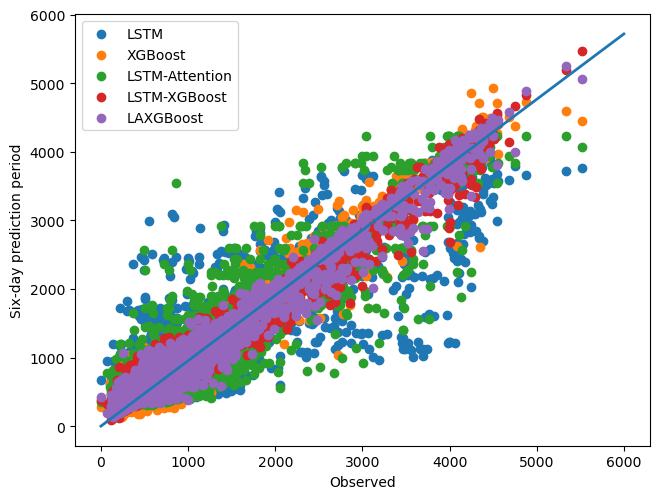

In [17]:
# 预测6天 回归图
# 预测值和观测值画回归图
a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Six-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\SixDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

a01=np.arange(6000)
a02=a01*0.953
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LSTM-Attention'][1:], label='LSTM-Attention')
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld6New['Observed'][1:],dfXld6New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Six-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\SixDayPreAll_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## 预测期9天

In [18]:
dfXld9=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre9',index_col='Date')

dfXld9New=dfXld9.iloc[1463:, :]
# dfXld6New.head()
dfXld9New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,553.620483,662.987122,530.505981,645.374146,511.56015
2011-01-04,459,560.187134,779.9599,546.954834,615.818054,482.608002
2011-01-05,493,567.137207,594.150269,547.017212,622.724609,507.189667
2011-01-06,493,575.645081,762.799255,519.751953,642.270691,495.550873
...,...,...,...,...,...,...
2024-03-07,524,827.405945,598.071289,633.498474,817.859558,484.407379
2024-03-08,826,969.926941,955.475037,830.630188,787.253845,711.486755
2024-03-09,1230,1118.71991,1101.625244,1170.911621,792.317932,967.331177


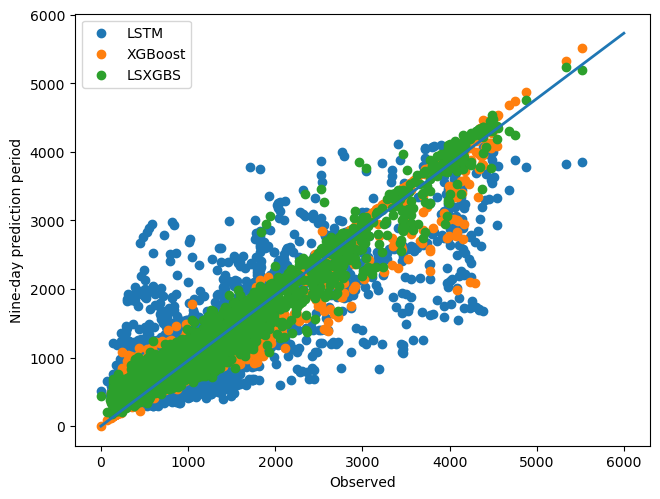

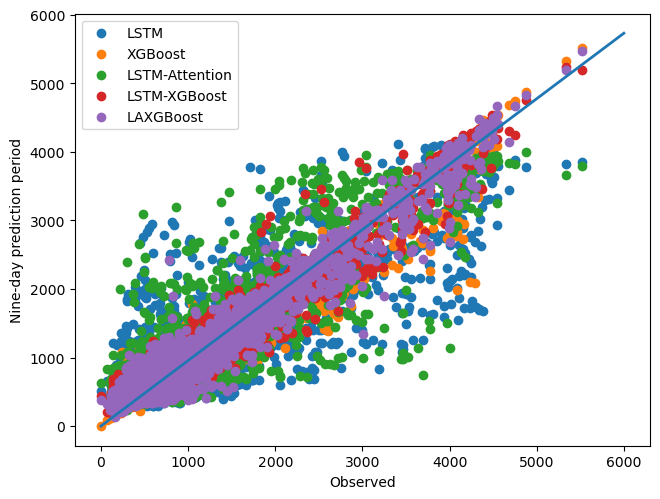

In [19]:
# 预测9天 回归图
# 预测值和观测值画回归图
a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Nine-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\NineDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LSTM-Attention'][1:], label='LSTM-Attention') 
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld9New['Observed'][1:],dfXld9New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Nine-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\NineDayPreAll_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## 预测期12天

In [20]:
dfXld12=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre12',index_col='Date')

dfXld12New=dfXld12.iloc[1463:, :]
# dfXld6New.head()
dfXld12New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,672.762939,511.782745,579.141296,645.374146,503.173767
2011-01-04,459,629.860474,465.578705,457.327179,615.818054,433.006317
2011-01-05,493,630.534912,498.22641,499.253784,622.724609,543.496216
2011-01-06,493,634.383179,515.025208,515.473389,642.270691,526.882812
...,...,...,...,...,...,...
2024-03-07,524,867.981201,730.036255,774.10437,817.859558,745.860229
2024-03-08,826,NaN,642.988464,796.864319,787.253845,823.713379
2024-03-09,1230,NaN,767.56366,1081.97583,792.317932,1165.303833


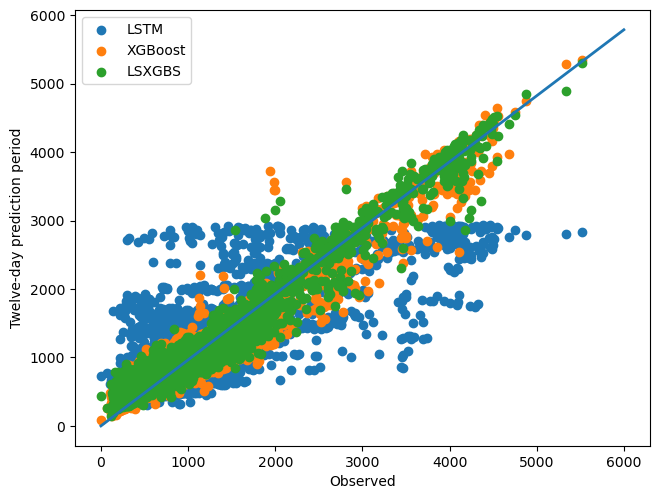

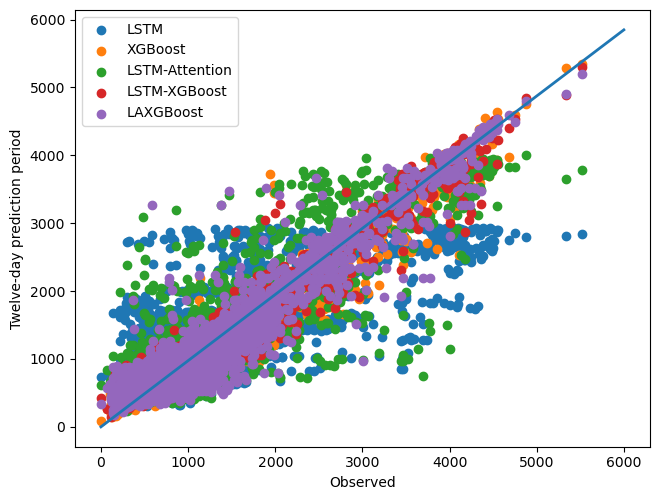

In [22]:
# 预测12天 回归图
# 预测值和观测值画回归图
a01=np.arange(6000)
a02=a01*0.965
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Twelve-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\TwelveDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

a01=np.arange(6000)
a02=a01*0.975
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LSTM-Attention'][1:], label='LSTM-Attention') 
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld12New['Observed'][1:],dfXld12New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Twelve-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\TwelveDayPreAll_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## 预测期15天

In [23]:
dfXld15=pd.read_excel(r"E:/BaiduSyncdisk/投稿计科-水文/提交版/03/Data/PredTabFig/多次评估指标均值后画图02.xlsx", sheet_name='XLDTruePre15',index_col='Date')

dfXld15New=dfXld15.iloc[1463:, :]
# dfXld6New.head()
dfXld15New

,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
Date,,,,,,
Date,Observed,LSTM,XGBoost,LSTM-XGBoost,LSTM-Attention,LAXGBoost
2011-01-03,486,575.469727,532.732483,439.391144,689.79657,493.735382
2011-01-04,459,572.079834,506.345306,528.128845,548.682068,460.940643
2011-01-05,493,569.195923,470.764679,499.607574,555.906006,493.539948
2011-01-06,493,564.951721,487.477112,418.672516,561.957947,500.812286
...,...,...,...,...,...,...
2024-03-07,524,NaN,756.206177,426.755371,932.232727,562.503174
2024-03-08,826,NaN,784.130005,871.026245,NaN,834.089844
2024-03-09,1230,NaN,1050.34375,1107.763916,NaN,1122.920288


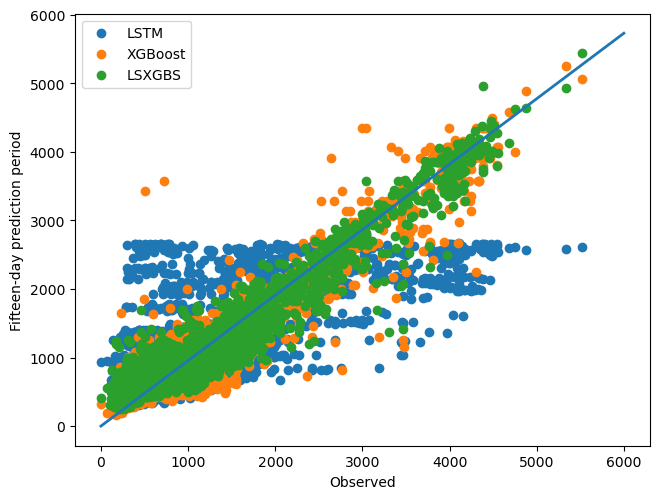

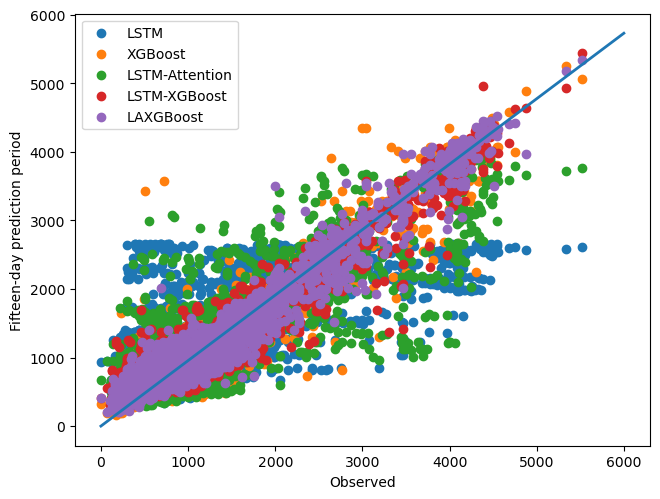

In [25]:
# 预测15天 回归图
# 预测值和观测值画回归图
a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LSTM-XGBoost'][1:], label='LSXGBS')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Fifteen-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\FifteenDayPre_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

a01=np.arange(6000)
a02=a01*0.955
# a02=a01
# plt.scatter(y3_test,svr_pred3_test,label="Observed",linewidth=2) 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LSTM'][1:], label='LSTM') 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['XGBoost'][1:], label='XGBoost') 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LSTM-Attention'][1:], label='LSTM-Attention') 
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LSTM-XGBoost'][1:], label='LSTM-XGBoost')
plt.scatter(dfXld15New['Observed'][1:],dfXld15New['LAXGBoost'][1:], label='LAXGBoost')
plt.plot(a01,a02,linewidth=2)
plt.xlabel('Observed')
plt.ylabel('Fifteen-day prediction period')
plt.legend()
plt.tight_layout(pad=0)#调整plt.tight_layout函数的参数来去除边缘空白。参考https://www.fke6.com/html/106130.html
plt.savefig(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\Metric&ImportanceFig\RegressionFig1465\FifteenDayPreAll_RegreXLD1465_1.tif', dpi=300,bbox_inches='tight',transparent=True)#transparent=True来指定透明度。
plt.show()

# import datetime
# # 保存图表到指定路径
# # current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# current_time = datetime.datetime.now().strftime("%H%M%S")
# print(current_time)
# # with pd.ExcelWriter(r'E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\PredData.xlsx', mode='a') as writer:
# #     results_dfXld1.to_excel(writer, sheet_name=f'{r2:.4f}HykLSTMAttXGBp1_{current_time}', index=False)
# save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
# plt.tight_layout(pad=0)
# plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
# plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

## SHAP图

 97%|=================== | 5195/5338 [00:32<00:00]       

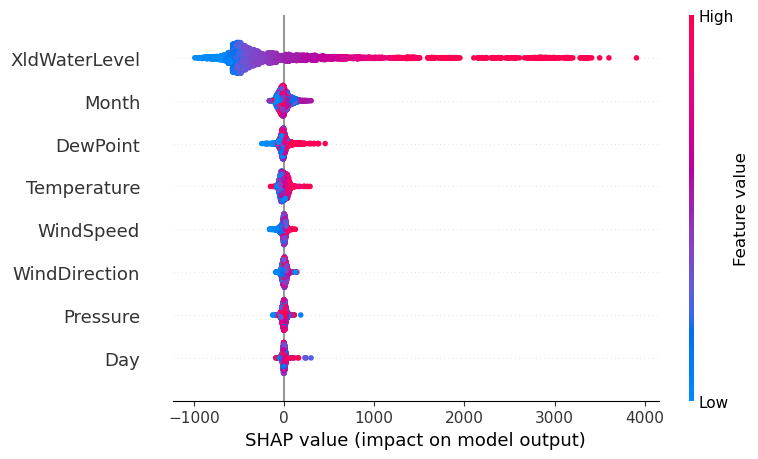

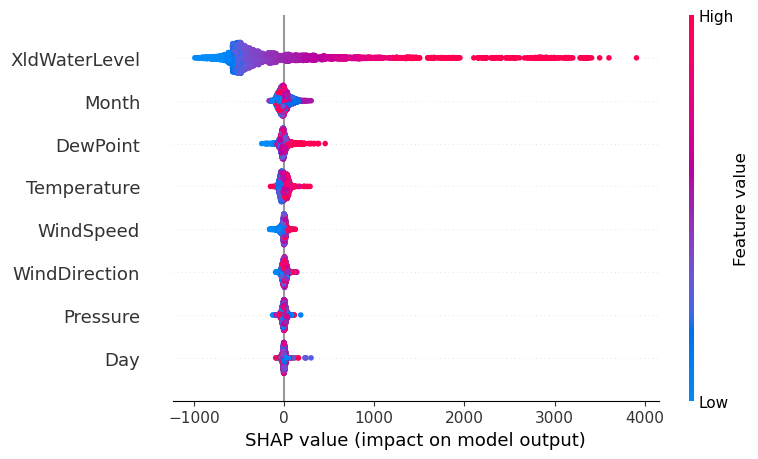

(5338, 8)

In [429]:
import shap
explainer=shap.Explainer(model, X_train) #一般来说，此处可以不传入数据而直接用explainer=shap.Explainer(model)。后续画图时，主要根据下句代码explainer(X_train)括号内的对象绘图。
shap_values=explainer(X_train)
shap.summary_plot(shap_values, X_train) # 前面解释的是X_test,此处就用X_test;如果解释的是X_train,那么此处就应该用X_train;
# shap.summary_plot(shap_values) # 前面explainer(X_train)括号内是啥，默认是啥。
shap_values.shape # 输出(5338, 8)

In [ ]:
# 绘制Summary Plot图
plt.figure()
plt.title("Summary Plot")
# shap.summary_plot(shap_values, X_train, show=False)  # 如果要保存下来必须show=False
shap.summary_plot(shap_values, show=False)  # 如果要保存下来必须show=False
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\summary_plot_{}.tif".format(current_time)
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

<Figure size 640x480 with 0 Axes>

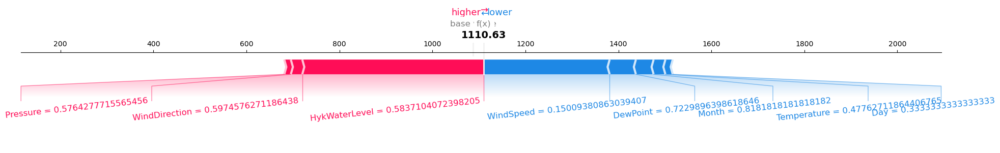

<Figure size 640x480 with 0 Axes>

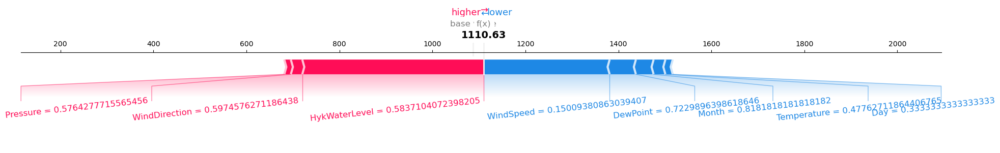

<Figure size 640x480 with 0 Axes>

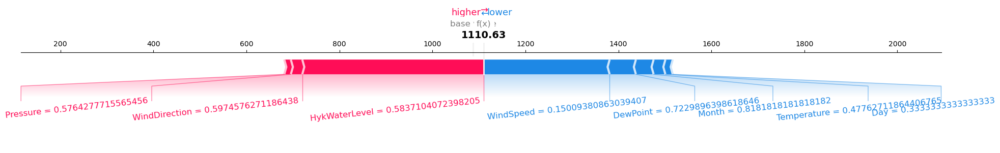

<Figure size 640x480 with 0 Axes>

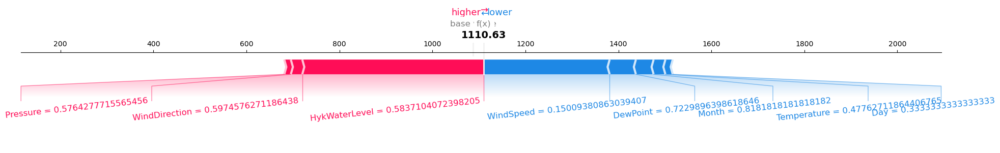

<Figure size 640x480 with 0 Axes>

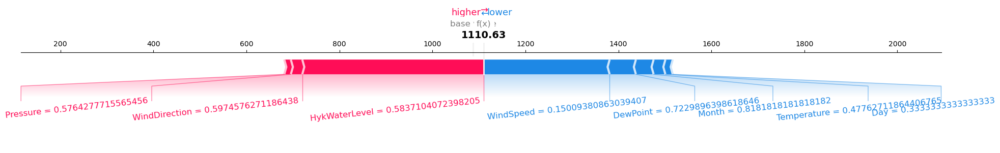

<Figure size 640x480 with 0 Axes>

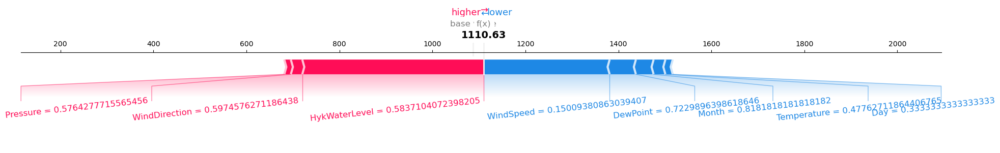

<Figure size 640x480 with 0 Axes>

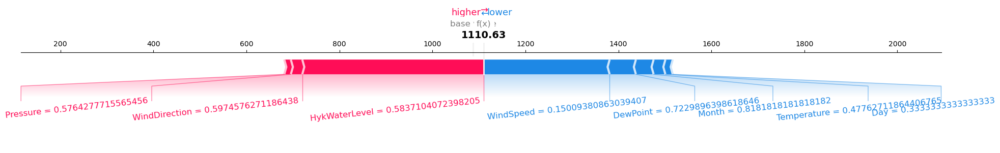

<Figure size 640x480 with 0 Axes>

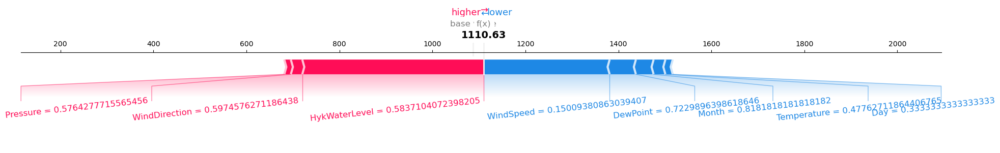

In [383]:
import datetime
import matplotlib.pyplot as plt

for i in range(190,198):    
    plt.figure()
    # shap.force_plot(shap_values)# 画此图，最好不要用shap.force_plot(shap_values)，这相当于画全部的shap_values,太慢了。可以shap_values[:30]类似的画一部分，或shap_values[30]画第30个。
    shap.plots.force(shap_values[82], matplotlib=True,show=False, text_rotation=6) # force图保存和其他图不易已。注意事项一定要添加：matplotlib=True,show=False；如果各特征值互相覆盖的话，那么添加text_rotation=6或其他数值。
    # 保存图表到指定路径
    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\force_plot{}_{}.tif".format(i, current_time)
    plt.tight_layout(pad=0)
    plt.savefig(save_path, dpi=300, transparent=True) #此处如果添加, bbox_inches='tight'的话，图片会变高。
    plt.show()

In [255]:
shap.plots.force(shap_values) # 等价于shap.force_plot(shap_values).画此图，最好不要画全部的shap_values,太慢了。可以shap_values[:30]类似的画一部分。

C:\ProgramData\anaconda3\envs\tf210\lib\site-packages\shap\plots\_force.py:208: UserWarning: shap.plots.force is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.plots.force is slow for many thousands of rows, try subsampling your data.")


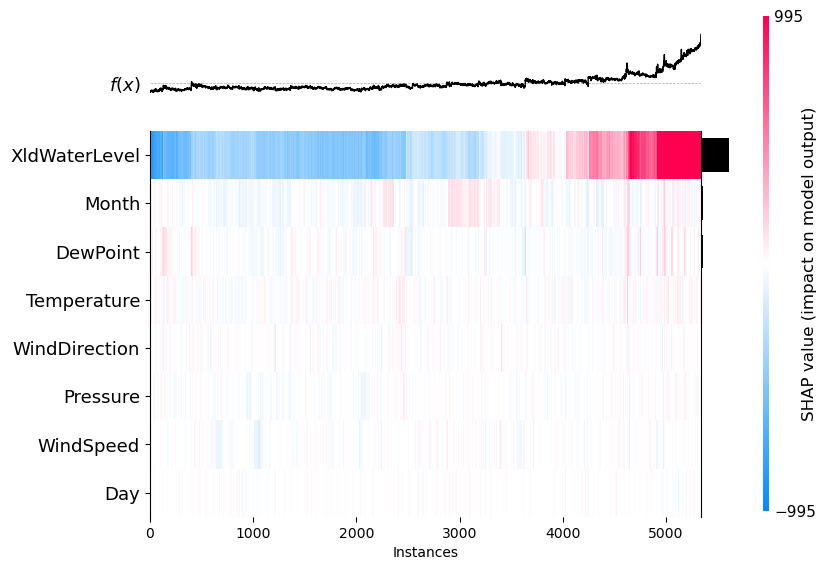

In [170]:
import datetime
import matplotlib.pyplot as plt

# 绘制 Heatmap
plt.figure()
shap.plots.heatmap(shap_values, show=False)  # 如果要保存下来必须show=False
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\heatmap_{}.tif".format(current_time)
plt.title("Heatmap")
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [ ]:
# 绘制 cohort 图
# shap.plots.scatter(shap_values[:, "XldWaterLevel"], color=shap_values, cmap="coolwarm")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, plot_cmap="coolwarm") #效果与shap.plots.scatter(shap_values[:, "XldWaterLevel"], color=shap_values, cmap="coolwarm")一样。LJT已测试。因为XldWaterLevel是第8个特征；0:8中的编号7，实际也就是第8个特征。

# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="jet")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="seismic_r")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="inferno")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="YlOrRd_r")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="autumn_r")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="magma")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="ocean")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="pink")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="plasma")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="jet_r")

# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="jet")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="gist_rainbow_r")
# shap.plots.scatter(shap_values[:, 7], color=shap_values, cmap="nipy_spectral")
# shap.plots.violin(shap_values,cmap="RdYlGn")

# 绘制Violin Plot小提琴图
plt.figure()
plt.title("Violin Plot")
shap.plots.violin(shap_values, show=False)
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\violin_plot_{}.tif".format(current_time)
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

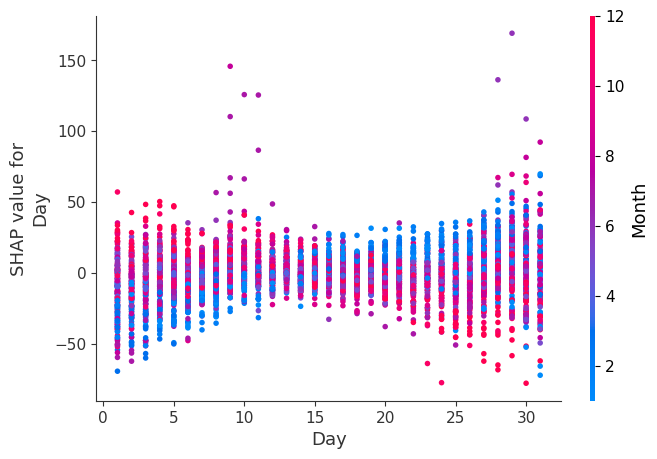

In [160]:
# 绘制 individual conditional expectation (ICE) plot
plt.figure()
shap.plots.partial_dependence("feature_0", model1.predict, X_test1_df, ice=True)
plt.show()

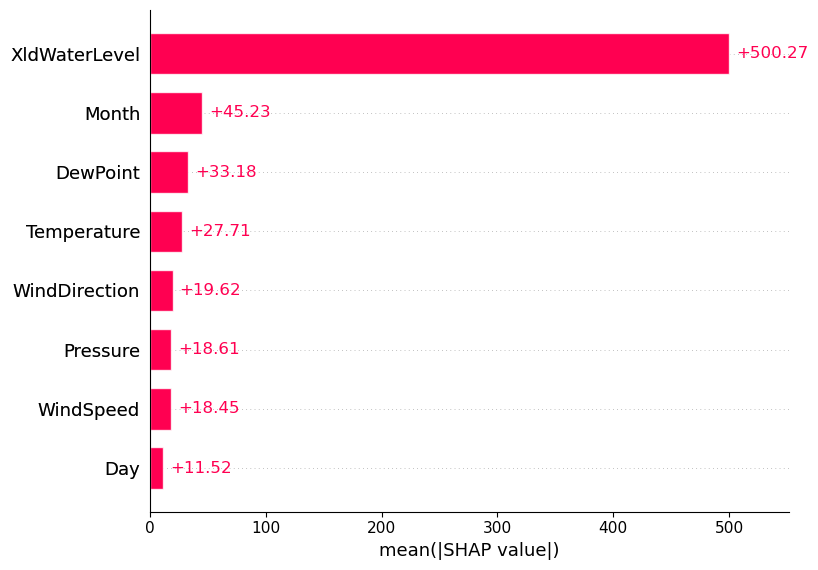

In [162]:
# 绘制 Bar图(默认前画出10个特征)或grouped bar图（可以指定任意个特征,比如通过参数max_display=20指定前20个特征
plt.figure()
plt.title("Bar Plot")
shap.plots.bar(shap_values)
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\bar_plot_{}.tif".format(current_time)
# plt.title("Bar Plot")
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

<Figure size 640x480 with 0 Axes>

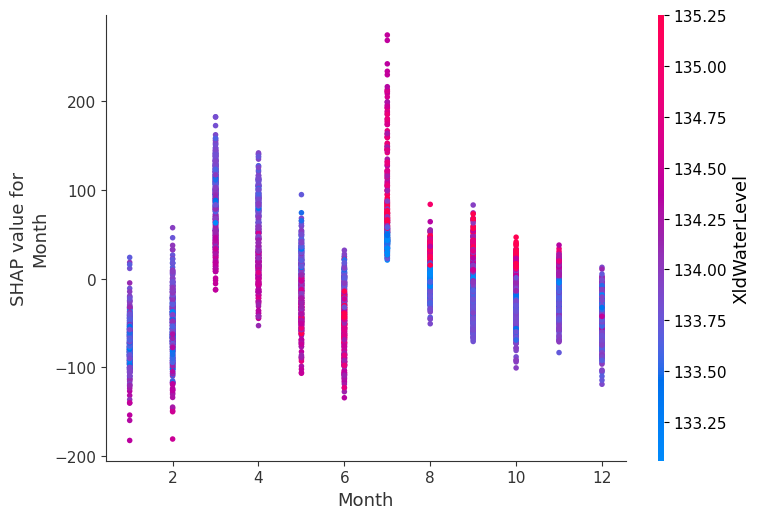

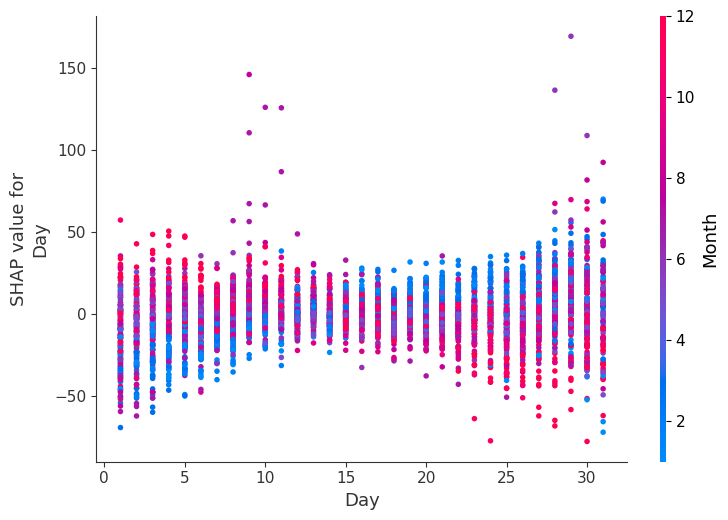

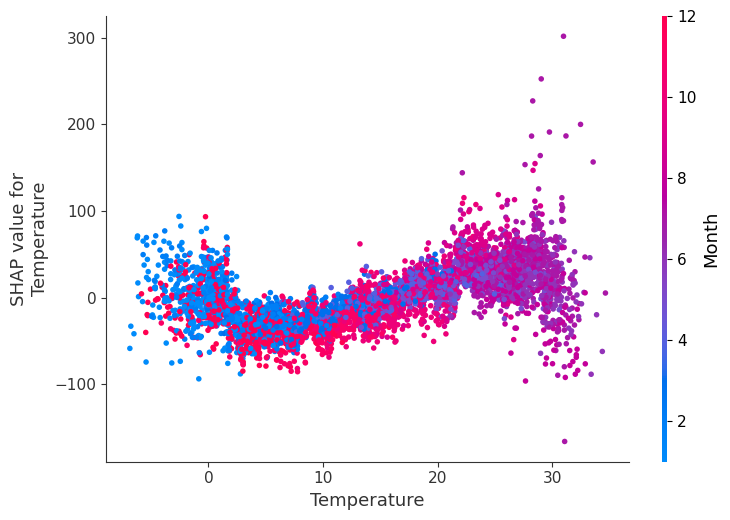

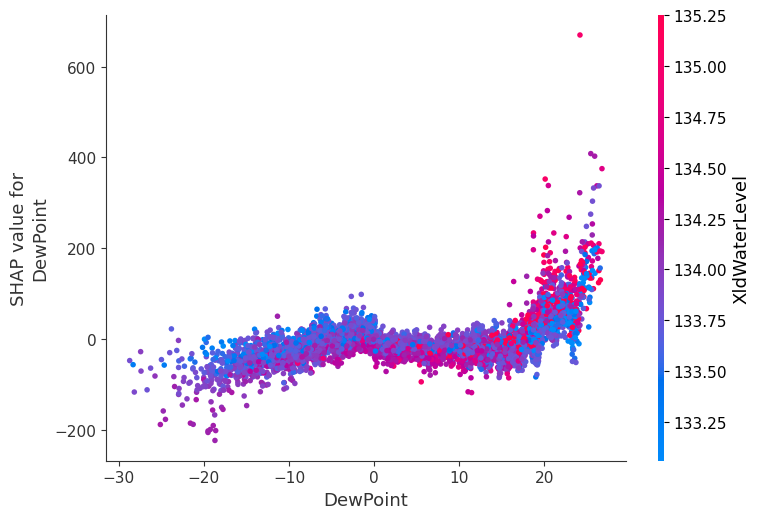

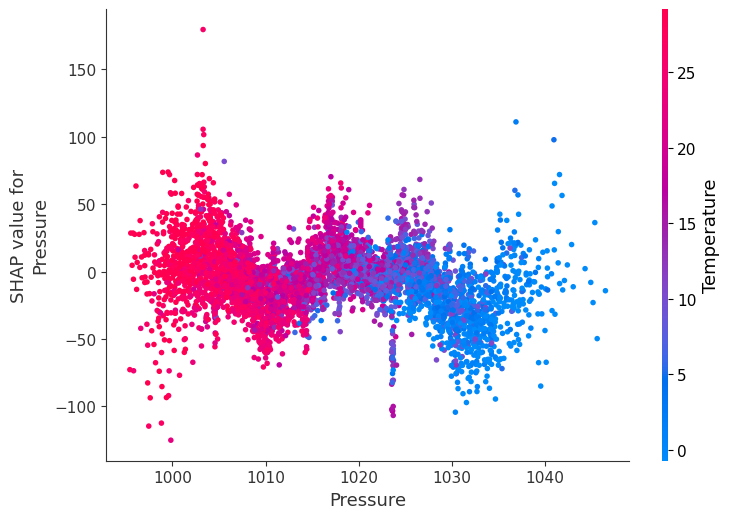

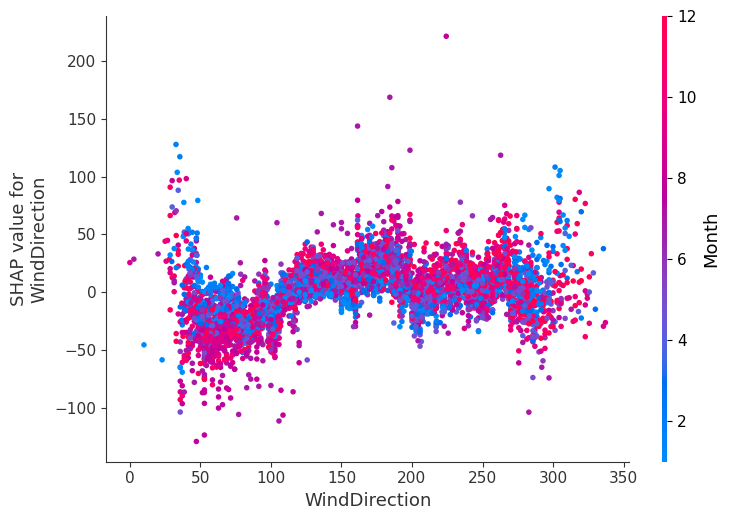

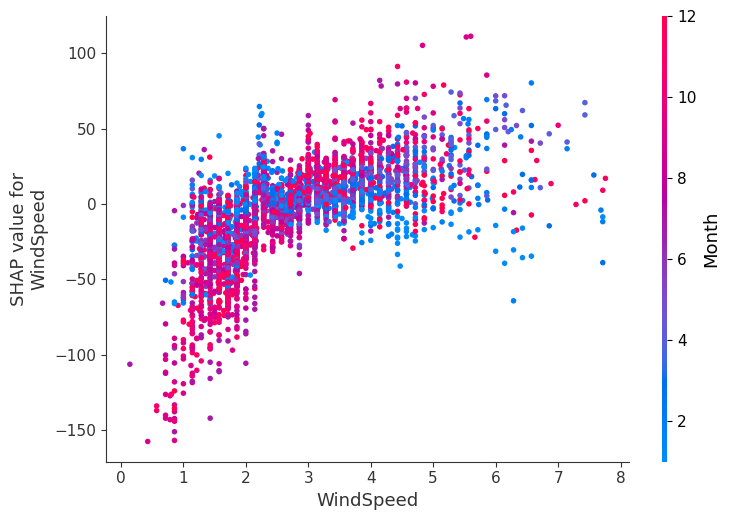

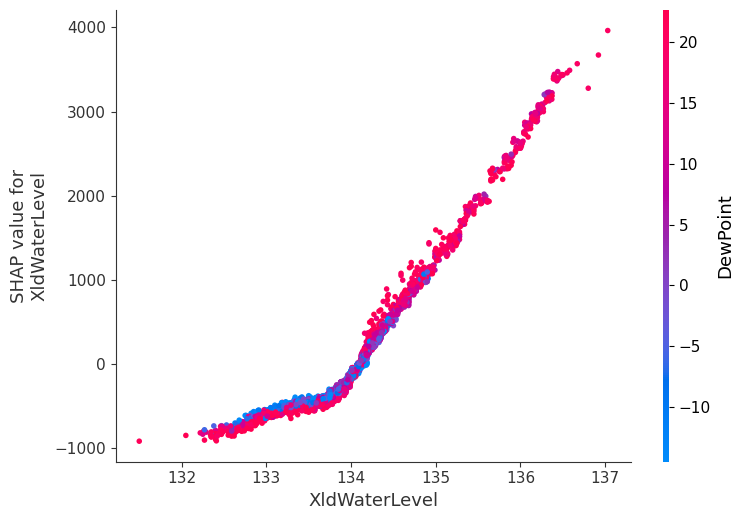

In [96]:
# 绘制依赖图dependence_plot
print(len(shap_values.shape)) # 2
print(shap_values.shape[0]) # 5338
print(shap_values.shape[1]) # 8
print(len(shap_values.values)) # 5338
print(len(shap_values.base_values))# 5338
print(len(shap_values.data))# 5338
# # for i in range(shap_values.shape[1]): #只不过借助名字命名
for name in shap_values.feature_names:
    plt.figure()
    # plt.title(name) #此处添加此句代码，在dependence_plot中好像没有真正的起作用(并没有显示title，而是在一个新生成的空图上显示title)。
    # 等价于for feature in shap_values.feature_names 或 基本等价于for name in X_train.columns或for name in X_test.columns或for i in range(shap_values.shape[1]),只不过借助名字命名.
    shap.dependence_plot(name, shap_values.values, X_train, show=False)  # 等价于shap.dependence_plot(name, shap_values.values, X_train,show=False, display_features=X_train)
    # 保存图表到指定路径
    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\dependence_plot{}_{}.tif".format(
        name, current_time)
    plt.title(name)#此处添加此句代码,才真正的起到命名的作用。
    plt.tight_layout(pad=0)
    plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。 

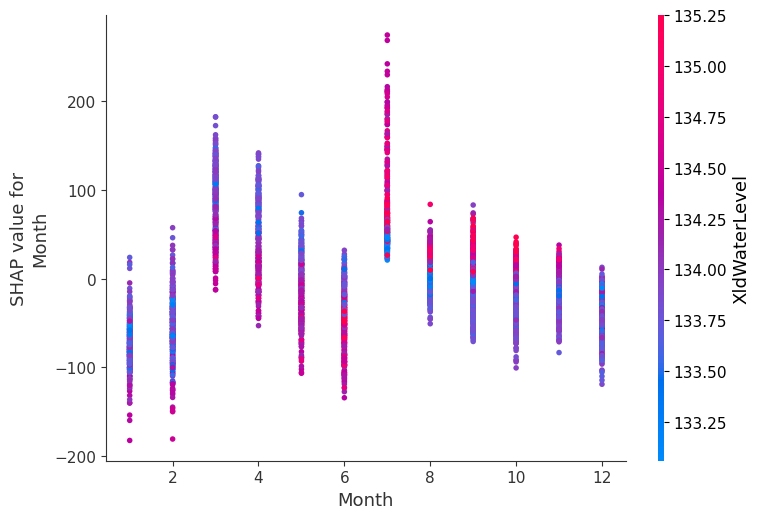

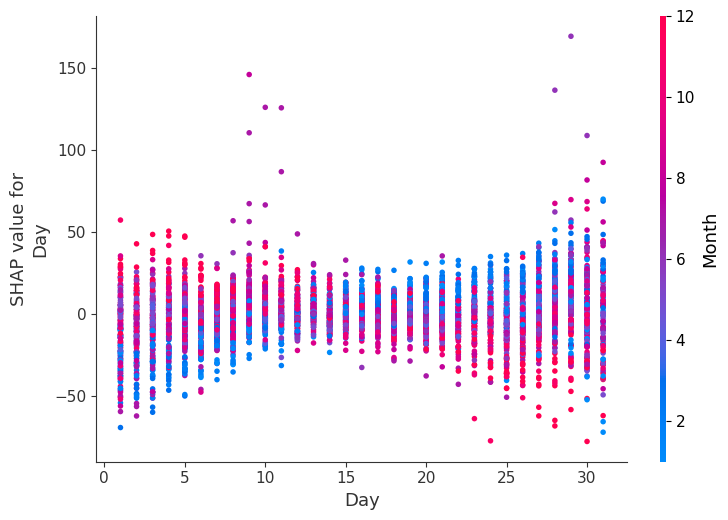

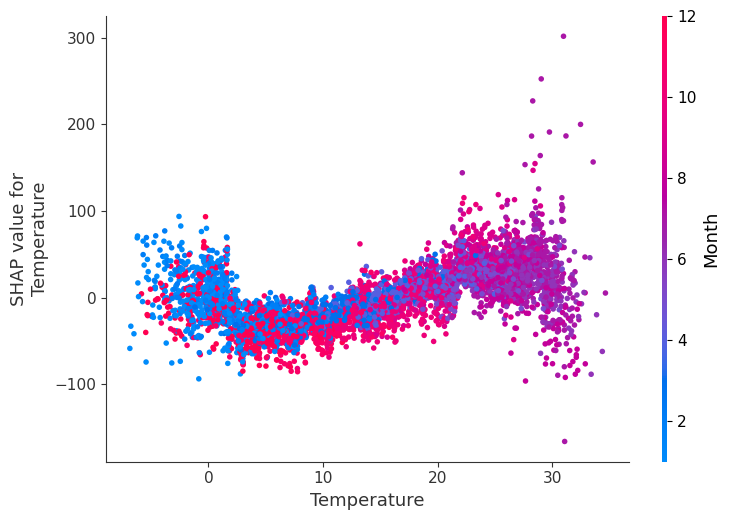

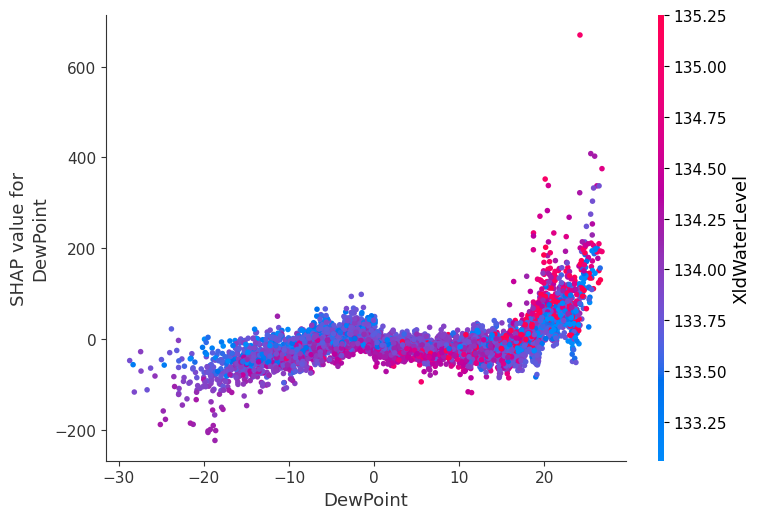

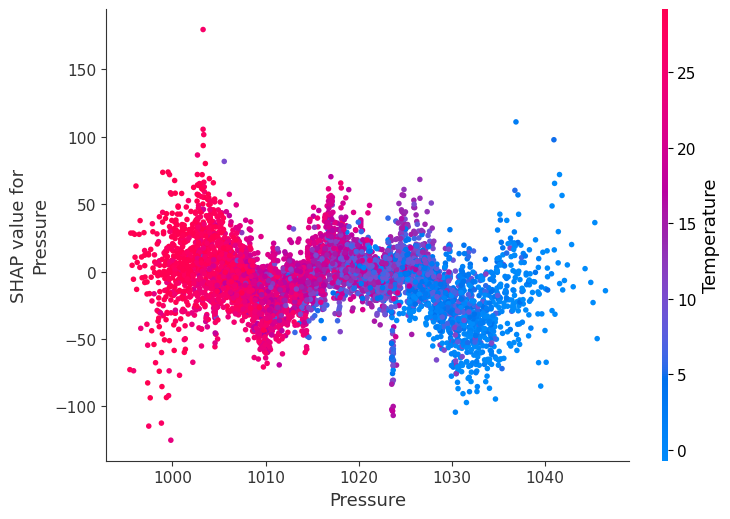

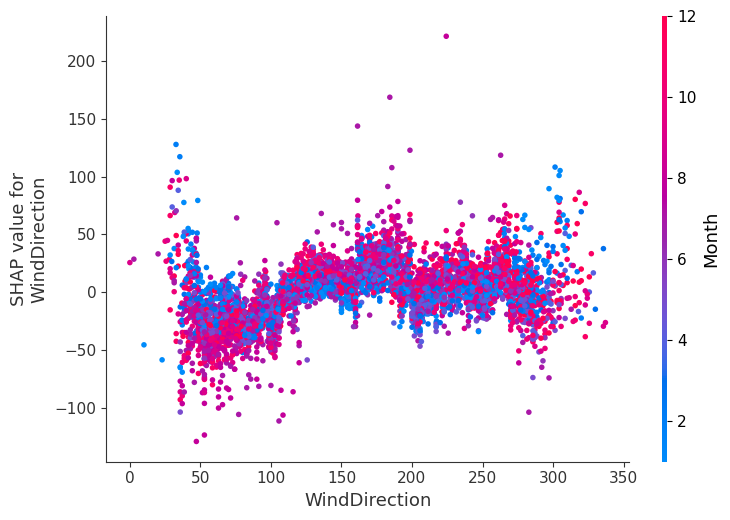

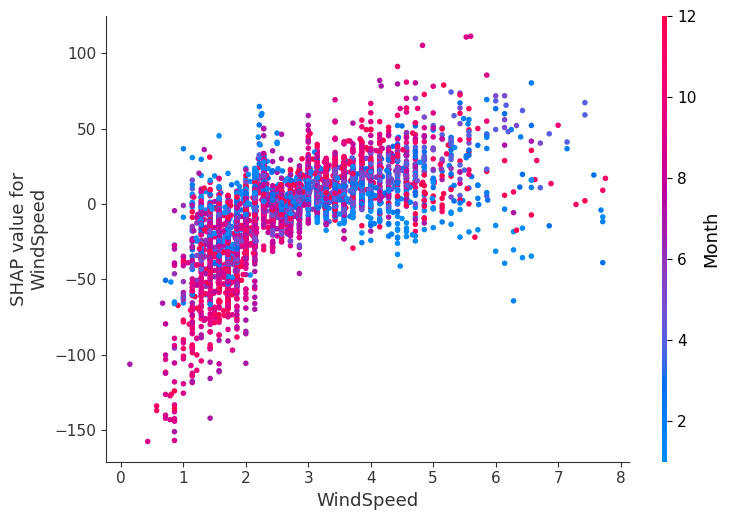

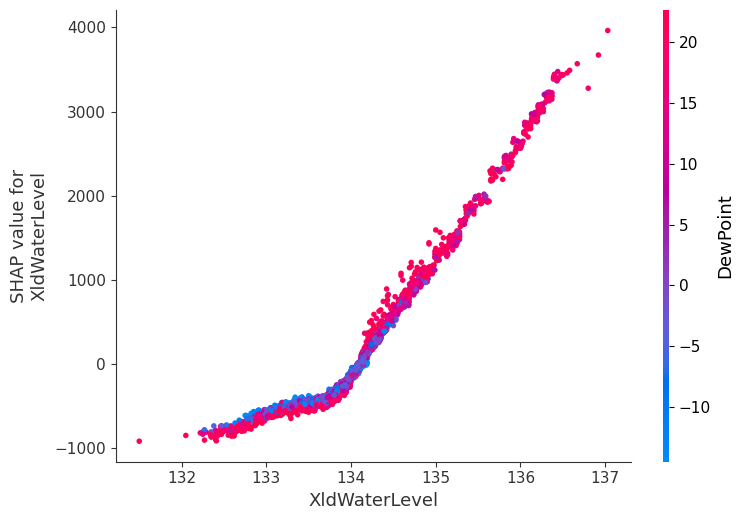

In [159]:
# 下面同上啊；for i in range(shap_values.shape[1]): #只不过借助名字命名
for name in shap_values.feature_names: 
    #等价于for feature in shap_values.feature_names 或 基本等价于for name in X_train.columns或for name in X_test.columns或for i in range(shap_values.shape[1]),只不过借助名字命名.
    plt.figure()
    shap.dependence_plot(name, shap_values.values, X_test,show=False)# 等价于shap.dependence_plot(name, shap_values.values, X_test,show=False, display_features=X_test)
    # 保存图表到指定路径
    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\dependence_plot{}_{}.tif".format(name, current_time)
    plt.title(name)#此处添加此句代码,才真正的起到命名的作用。
    plt.tight_layout(pad=0)
    plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。 

<Figure size 640x480 with 0 Axes>

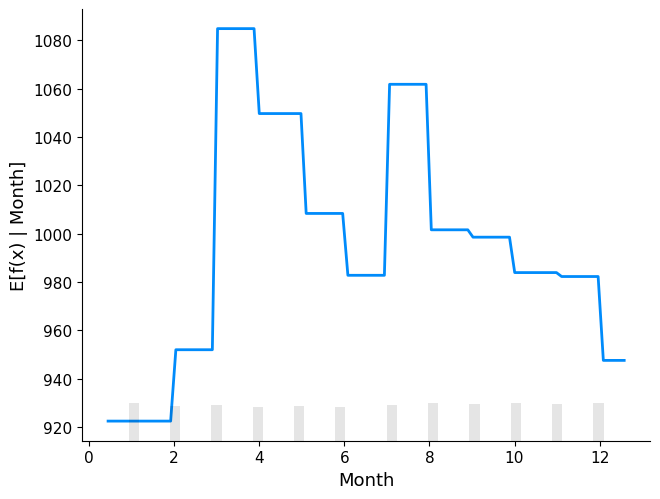

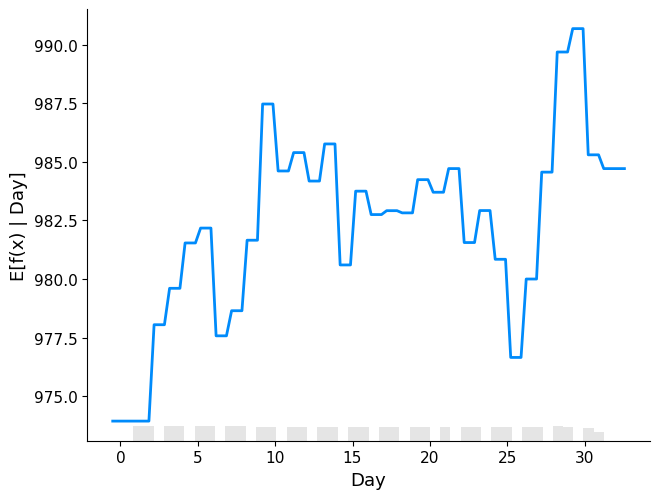

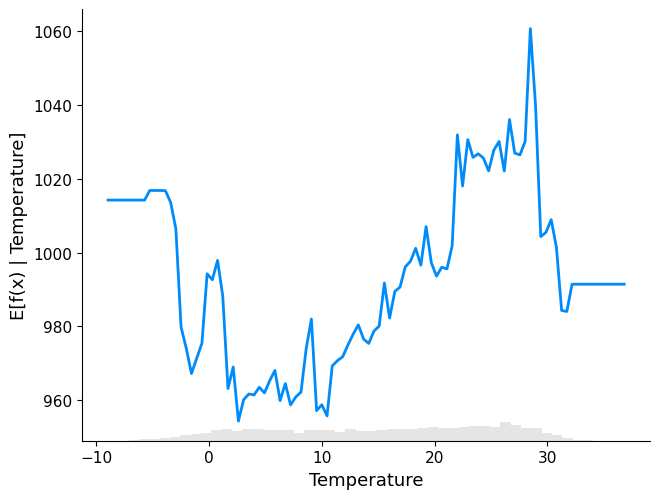

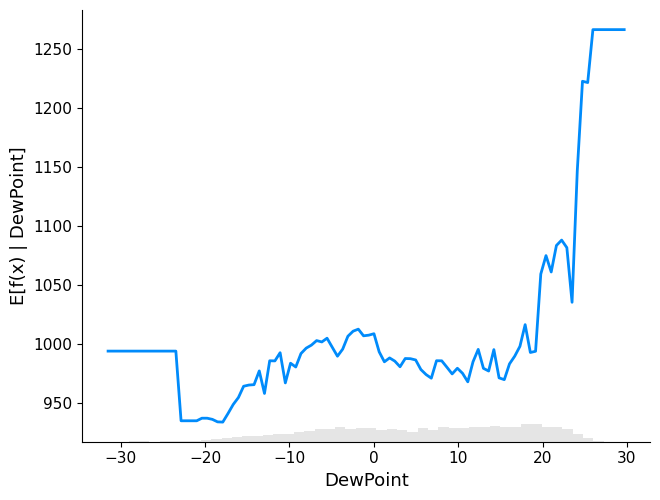

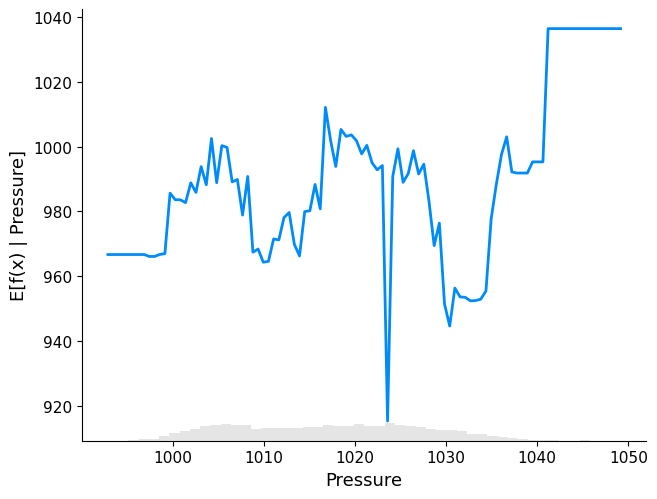

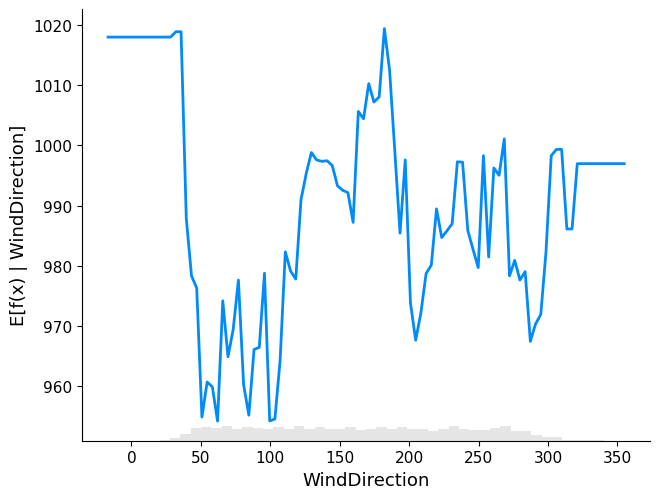

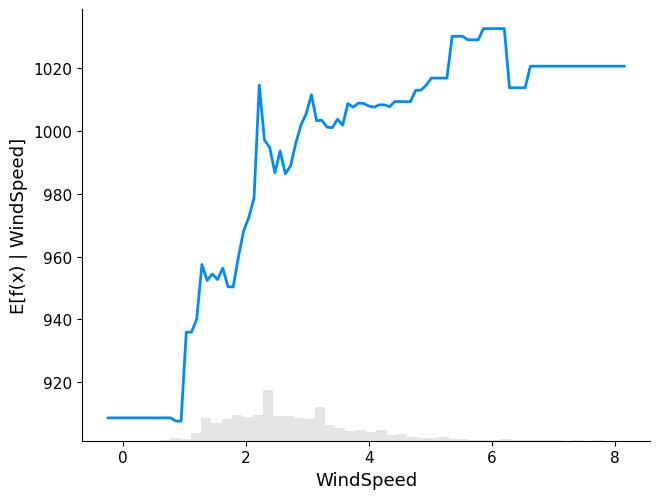

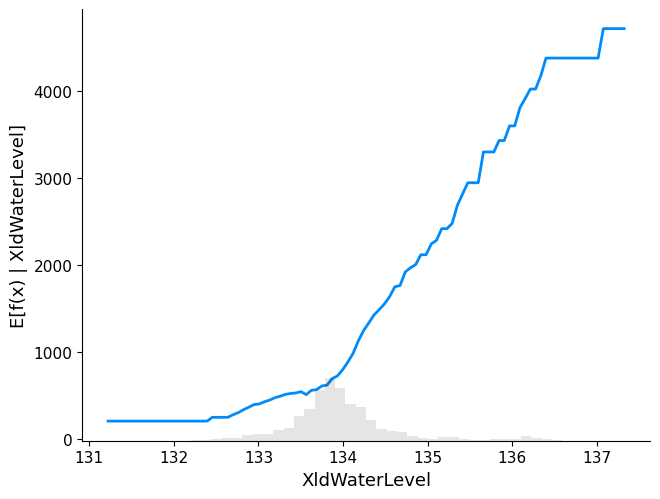

In [158]:
# 绘制 partial dependence plot 部分依赖图
# shap.plots.partial_dependence("某个feature", model.predict, X_test_sampled, ice=True)
# shap.plots.partial_dependence(0,shap_values,X_test)
# shap.plots.partial_dependence("XldWaterLevel", model.predict, X_test, ice=False)
# shap.plots.partial_dependence("XldWaterLevel", model.predict, X_test, ice=False)

import datetime
import matplotlib.pyplot as plt

# 绘制部分依赖图：partial_dependence
# shap.plots.partial_dependence("XldWaterLevel", model.predict, X_test, ice=False)#因为默认ice=True,所以参数设为ice=False。
# shap.plots.partial_dependence("XldWaterLevel", model.predict, X_train, ice=False)
for name in shap_values.feature_names: #等价于for name in X_train.columns:
    plt.figure()
    shap.plots.partial_dependence(name, model.predict, X_train, ice=False, show=False)
    # 保存图表到指定路径
    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\partial_dependence{}_{}.tif".format(name, current_time)
    plt.title(name)#此处添加此句代码,才真正的起到命名的作用。
    plt.tight_layout(pad=0)
    plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

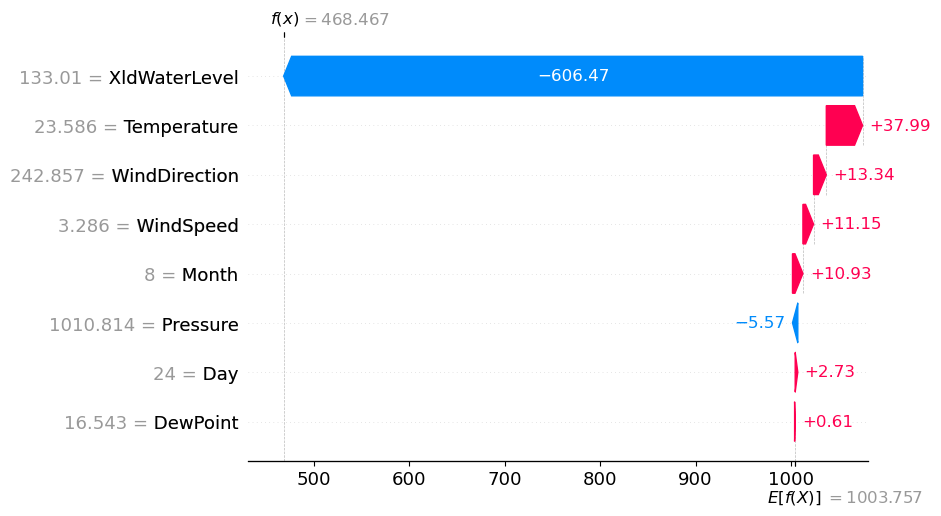

In [128]:
# 绘制waterfall瀑布图 需要根据实际情况调整范围或数值:将单个预测的解释绘制为瀑布图,要绘制不同月份的以对比对目标特征影响的贡献度差异。
# 此处只能选择单个样本，可以从不同月份分析。6-9月份，月份对结果影响大，水位就相对较小了。每变更一个月增减30天左右。变更一年增减365左右。要绘制不同月份的以对比对目标特征影响的贡献度差异。
# 特征的SHAP值表示该特征提供的证据对模型输出的影响。瀑布图旨在直观地显示每个特征的SHAP值（证据）如何将模型输出从背景数据分布下的先前预期移动到给定所有特征证据的最终模型预测。
# 当模型中的特征数量超过“最大显示”参数时，特征根据其SHAP值的大小进行排序，最小大小的特征分组在图的底部。
plt.figure()
shap.plots.waterfall(shap_values[3719],show=False) #当然也可以用for循环来进行特定范围内shap_values[i]的指定。
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\HYKshap\water_plot_{}.tif".format(current_time)
plt.title("Waterfall Plot")#此处添加此句代码,才真正的起到命名的作用
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight',transparent=True)
plt.show() # 可选用plt.show()不用的话有时可能不显示。

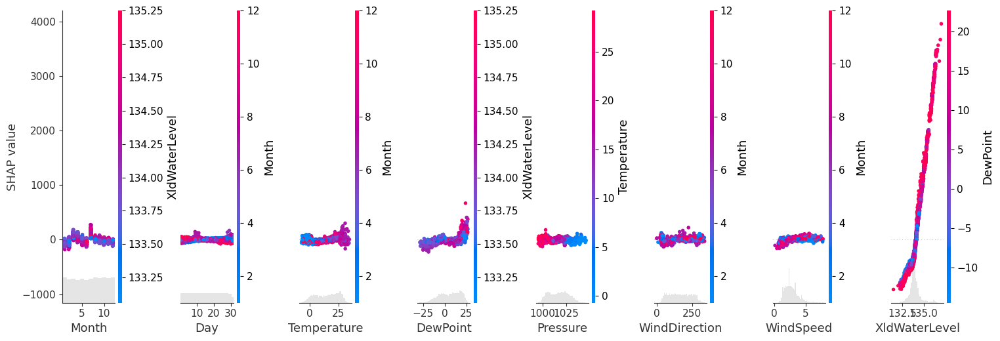

In [148]:
import datetime
import matplotlib.pyplot as plt

plt.figure()
shap.plots.scatter(shap_values[:, 0:8],show=False, color=shap_values) #如果要保存下来必须show=False
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\scatter_plot_{}.tif".format(current_time)
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [140]:
shap_values.feature_names

Index(['Month', 'Day', 'Temperature', 'DewPoint', 'Pressure', 'WindDirection',
       'WindSpeed', 'XldWaterLevel'],
      dtype='object')

In [141]:
shap_values.feature_names[1] # 'Day'

'Day'

In [142]:
for feature in shap_values.feature_names:#shap_values.shape[1]为列。也即特征维度。
    print(feature)

Month
Day
Temperature
DewPoint
Pressure
WindDirection
WindSpeed
XldWaterLevel


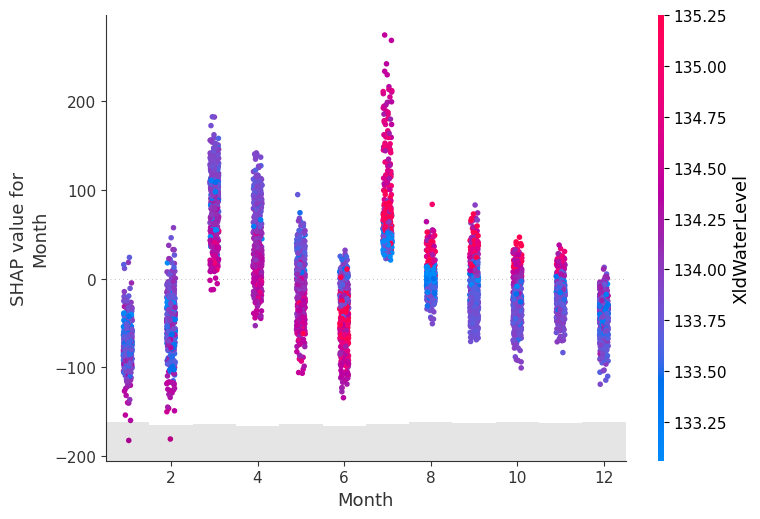

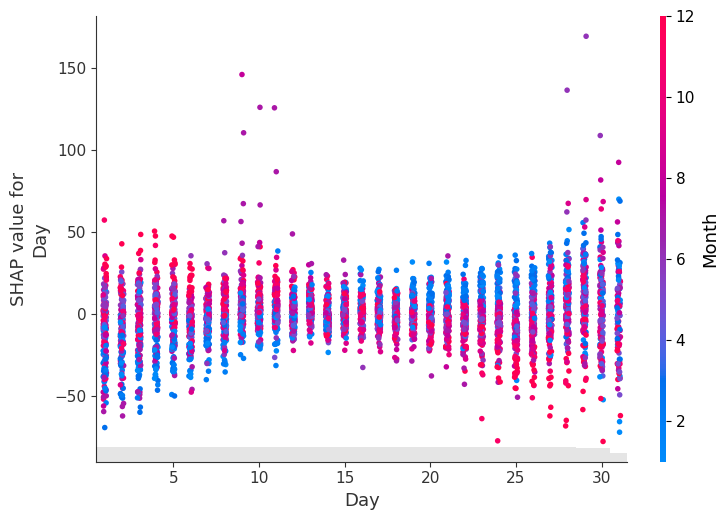

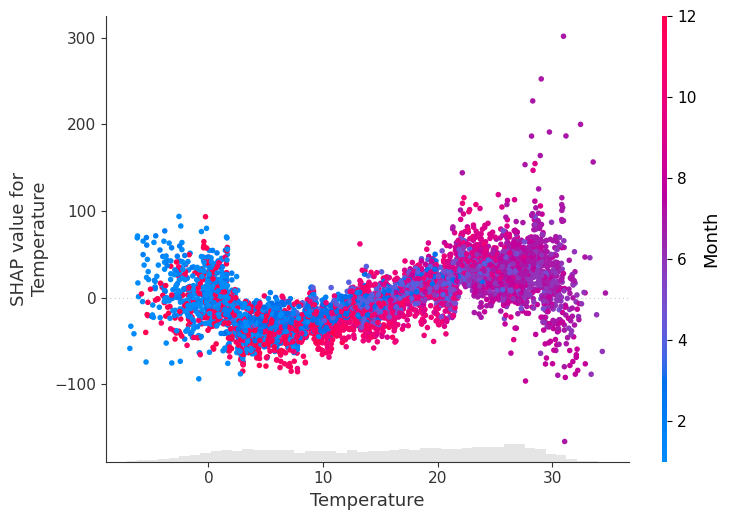

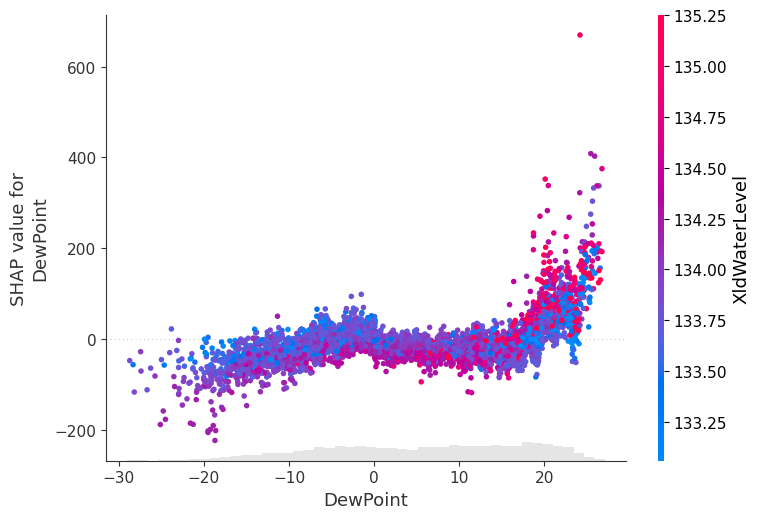

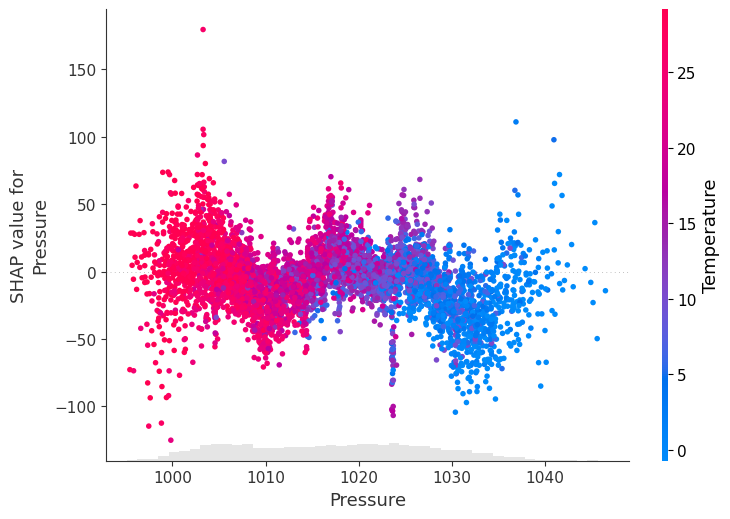

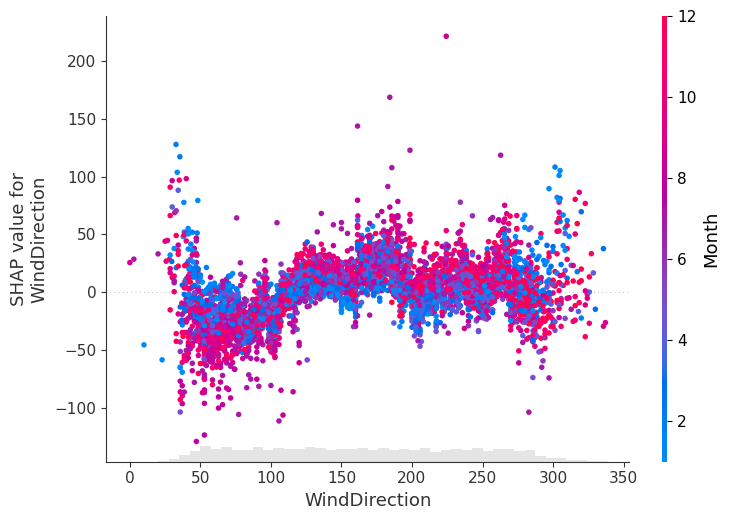

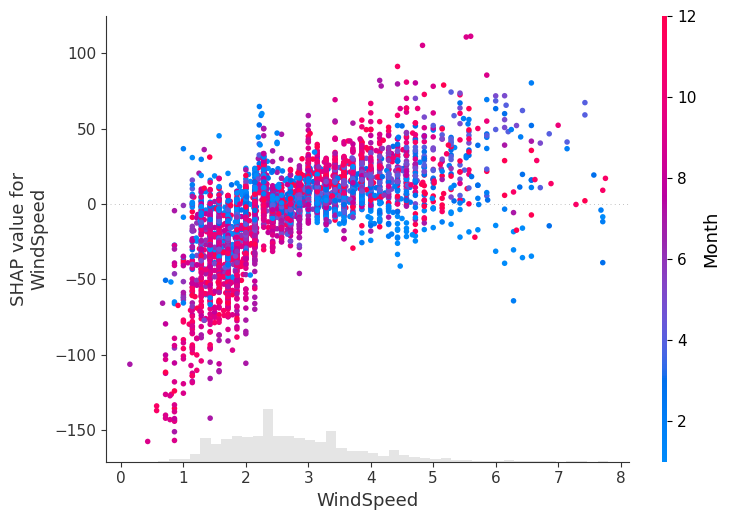

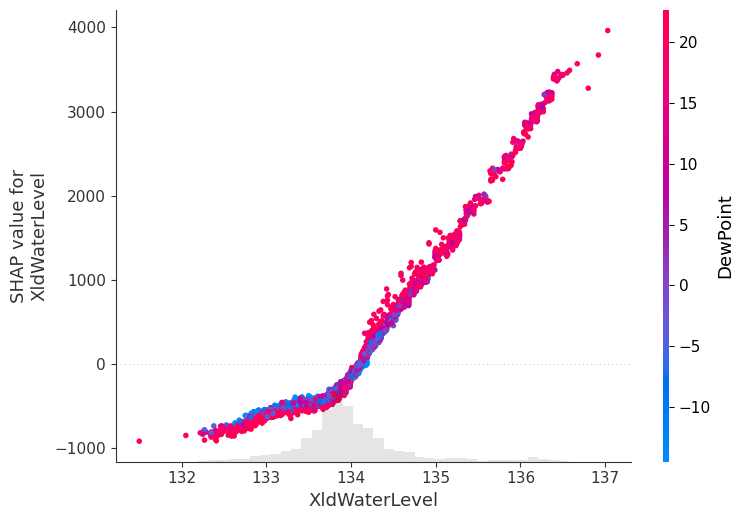

In [146]:
# shap.plots.scatter(shap_values[:, "Month"], color=shap_values[:, "XldWaterLevel"])#XldWaterLevel是数据集的一个特征。目的是使得出图的右边颜色渐变竖条的数值变为对应特征的不同属性；比如特征是性别，其属性为男或女；特征是年龄的话，属性那就是不同的年龄；特征是等级的话，那属性就是不同给的等级。

for name in shap_values.feature_names:  # shap_values.shape[1]为列。也即特征维度。for i in range(shap_values.shape[1])。
    plt.figure()
    shap.plots.scatter(shap_values[:, name], show=False, color=shap_values)  # 如果要保存下来必须show=False
    # 保存图表到指定路径
    current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\HYKshap\scatter_plot{}_{}.tif".format(name, current_time)
    plt.title(name)#此处添加此句代码,才真正的起到命名的作用。
    plt.tight_layout(pad=0)
    plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
    plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

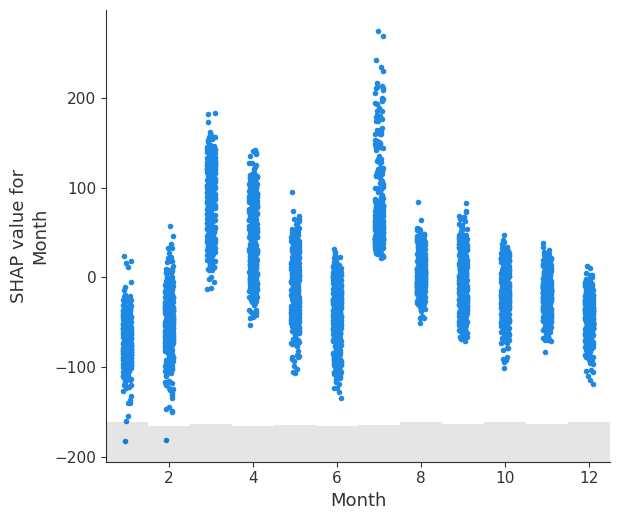

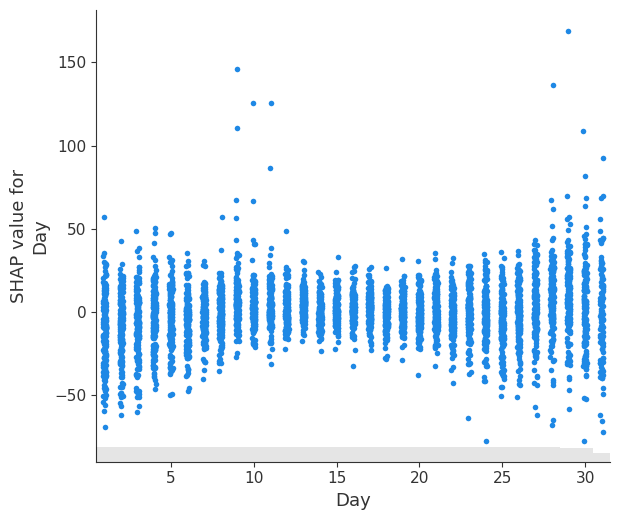

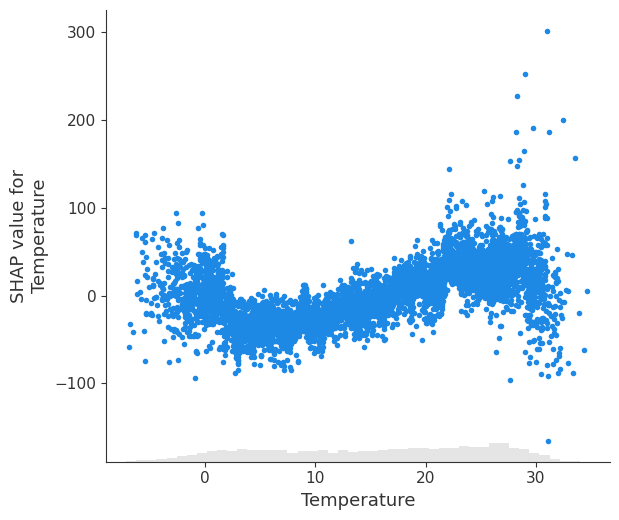

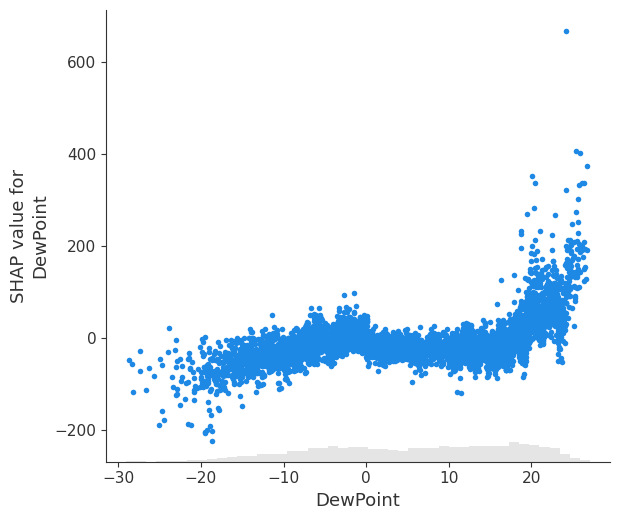

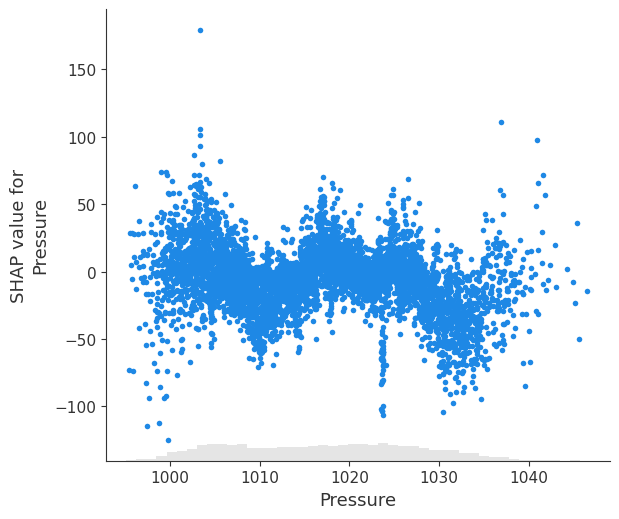

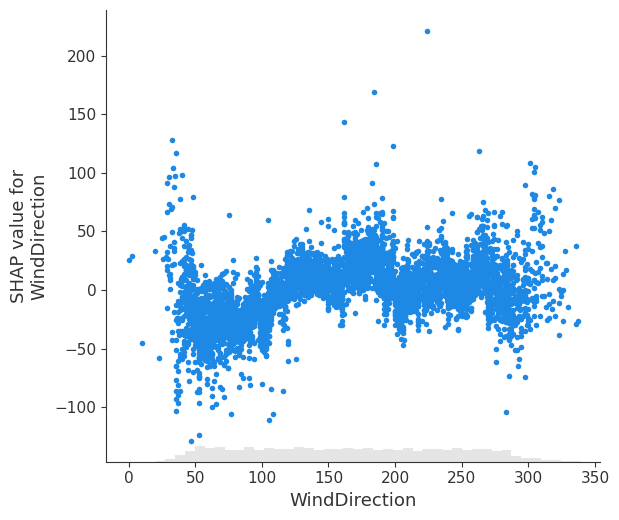

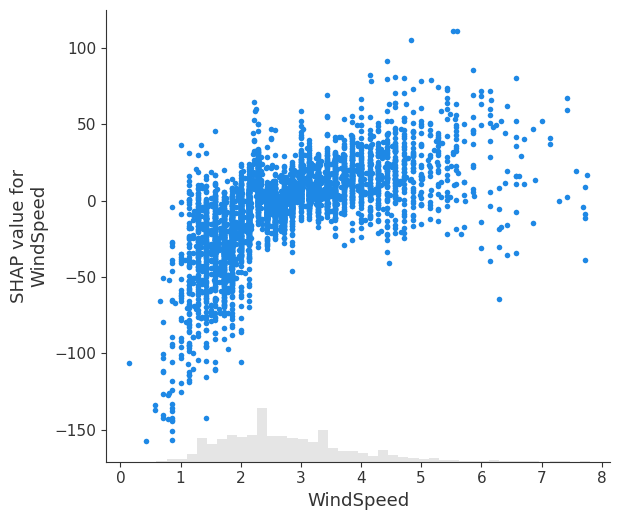

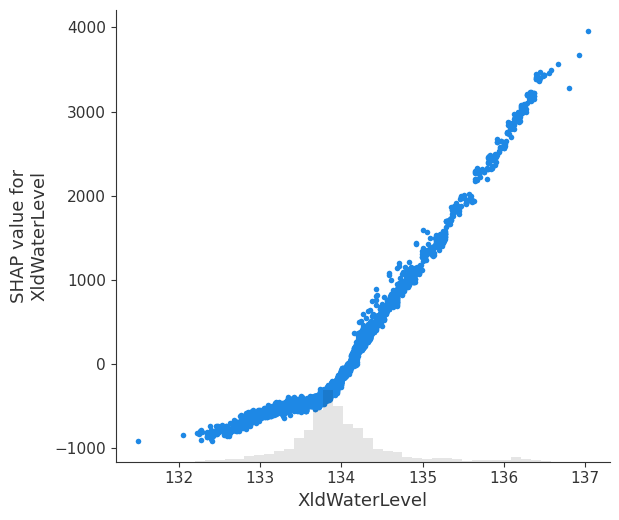

In [135]:
# #这个也很好，只不过是用i来命名各个图的。
# import datetime
# import matplotlib.pyplot as plt

# for i in range(shap_values.shape[1]):#shap_values.shape[1]为列。也即特征维度。
#     plt.figure()
#     shap.plots.scatter(shap_values[:, i],show=False, color=shap_values) #如果要保存下来必须show=False
#     # 保存图表到指定路径
#     current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
#     save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\XLDshap\scatter_plot{}_{}.tif".format(i,current_time)
#     plt.tight_layout(pad=0)
#     plt.savefig(save_path, dpi=300, transparent=True)
#     plt.show()

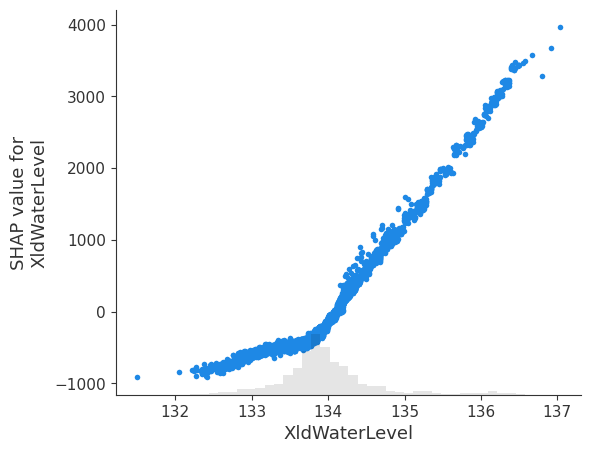

In [150]:
shap.plots.scatter(shap_values[:, "XldWaterLevel"],show=False, cmap=plt.get_cmap("cool"))

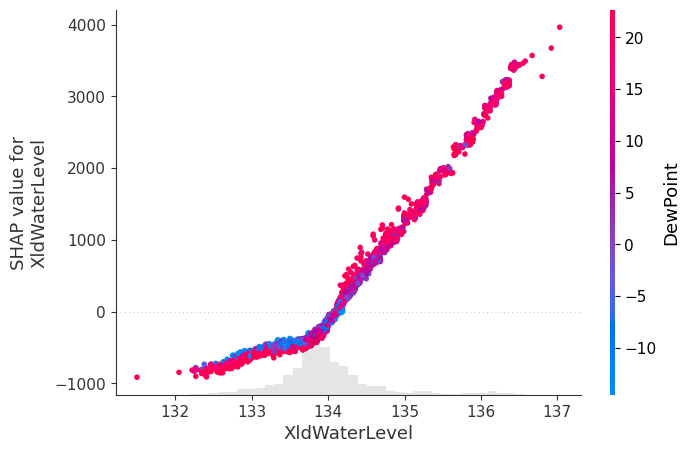

In [154]:
shap.plots.scatter(shap_values[:, "XldWaterLevel"],show=False, color=shap_values)

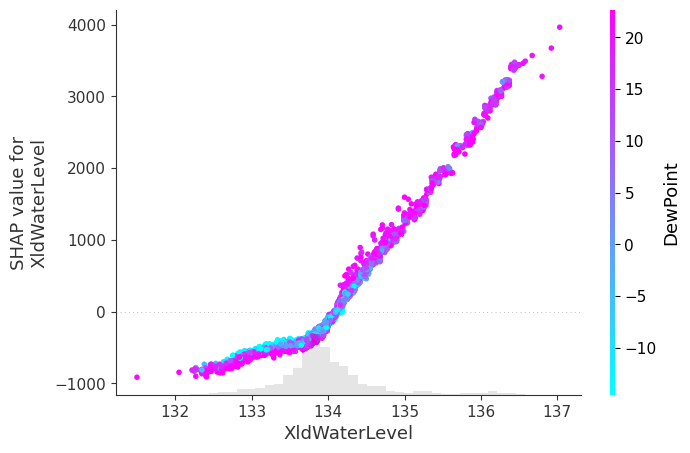

In [152]:
# shap.plots.scatter(shap_values[:, 0],show=False, color=shap_values)
# shap.plots.scatter(shap_values[:, 1],show=False, color=shap_values)
# shap.plots.scatter(shap_values[:, "XldWaterLevel"],show=False, color=shap_values)
shap.plots.scatter(shap_values[:, "XldWaterLevel"],show=False, color=shap_values, cmap=plt.get_cmap("cool"))

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


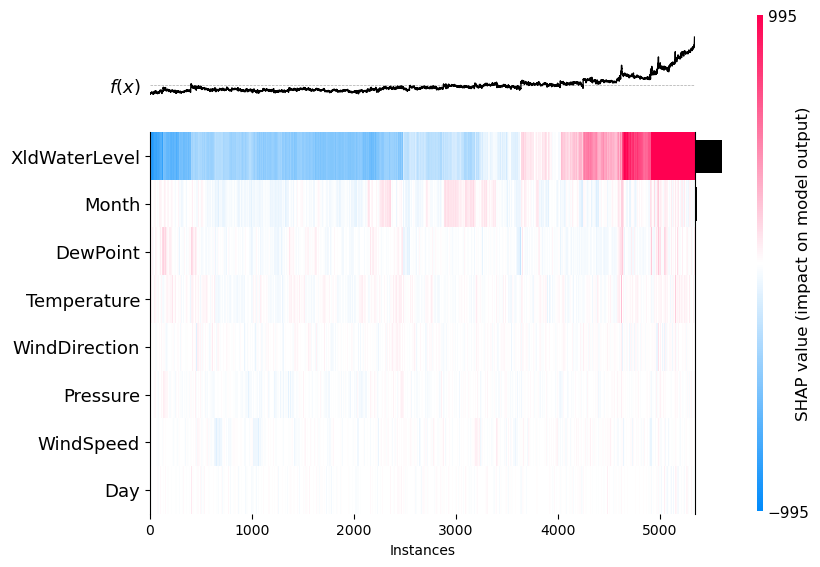

<Axes: xlabel='Instances'>

In [28]:
shap.plots.heatmap(shap_values)

In [29]:
X_test.head()

,Month,Day,Temperature,DewPoint,Pressure,WindDirection,WindSpeed,XldWaterLevel
date,,,,,,,,
2024-03-09,3.0,9.0,10.500000,-3.357143,1022.885714,162.857143,2.571429,134.08
2024-03-10,3.0,10.0,11.785714,2.000000,1021.342857,252.857143,4.142857,134.22
2024-03-11,3.0,11.0,16.980000,-3.620000,1017.180000,304.000000,4.800000,134.24


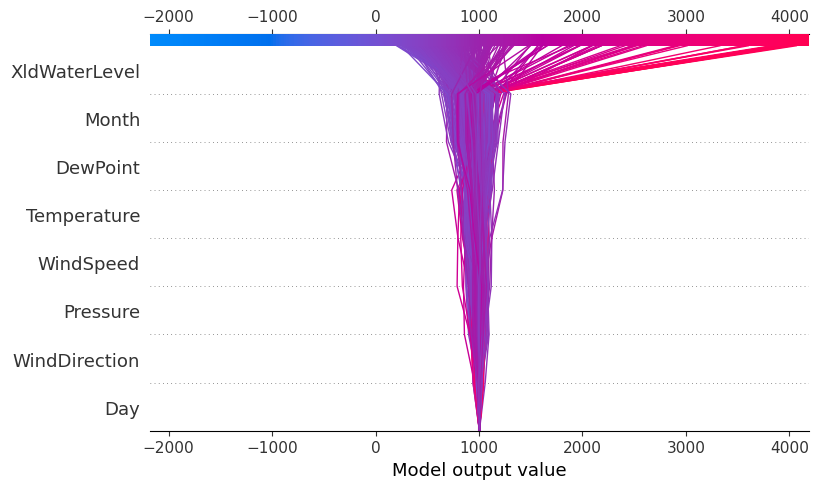

In [243]:
import datetime
import matplotlib.pyplot as plt

# 绘制Decision图 需要根据实际情况调整范围或数值
plt.figure() #此句代码为避免与上一个出图互相重叠覆盖。
plt.title("Decision Plot")
shap.plots.decision(explainer.expected_value, shap_values.values[330:820], X_train,show=False)
# shap.plots.decision(explainer.expected_value, shap_values.values[300:820])#与上一句的结果一模一样。因为前面explainer(X_train)括号内是啥(X_train)，默认是啥(X_train)。但是需要注意的是，如果不用具体的X_train或X_test，那么出的图的特征名则是默认的"feature 0"之类的等。而上一句特征名则是实际特征名。如果有警告可以通过ignore_warnings=True忽略警告。
# 保存图表到指定路径
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
save_path = r"E:\BaiduSyncdisk\投稿计科-水文\提交版\03\Data\PredTabFig\HYKshap\decision_{}.tif".format(current_time)
plt.tight_layout(pad=0)
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)
plt.show()# 因为上面show=False了，此句使得在jupyter中也能显示。

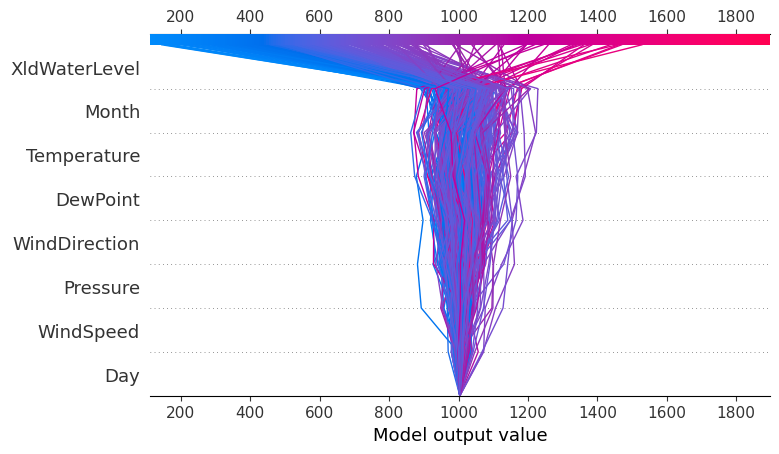

In [69]:
shap.plots.decision(explainer.expected_value, shap_values.values[:300], X_test)